<a href="https://colab.research.google.com/github/rayzasantos/Dashboard/blob/Dashboard/C%C3%B3digo_da_pesquisa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# -*- coding: utf-8 -*-

notebook_dtw_final.ipynb

Automatically generated by Colab.

Original file is located at
    https://colab.research.google.com/drive/1bRdRcHYqc01JFJOCGn9kBfrVu_Vp0bJQ

# Notebook Principal — DTW Exato + Clustering Hierárquico Univariado + Dendrogramas com Séries

Este notebook contém o fluxo principal da dissertação:

- pré-processamento canônico;
- DTW exato univariado intrapoço e interpoços;
- clustering hierárquico sobre matrizes DTW;
- seleção transparente de `k_final`;
- dendrogramas coloridos com corte e visualização das séries reamostradas na ordem das folhas.

A análise baseada em densidade (DBSCAN/OPTICS/HDBSCAN) deve permanecer em notebook separado como etapa de sensibilidade e robustez.

## 1. Ambiente e bibliotecas

In [2]:

try:
    from google.colab import drive
    drive.mount('/content/drive')
except Exception:
    print('Execução fora do Colab ou Google Drive indisponível. Ajuste DIRECTORY manualmente na próxima célula.')

# Commented out IPython magic to ensure Python compatibility.
import os, sys, time, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Dict, List, Tuple, Optional

from scipy.cluster.hierarchy import linkage, fcluster, dendrogram, cophenet
from scipy.cluster.hierarchy import optimal_leaf_ordering
from scipy.spatial.distance import squareform
from scipy.stats import spearmanr
from sklearn.metrics import silhouette_score

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
# %matplotlib inline

print('Python :', sys.version)
print('Pandas :', pd.__version__)
print('NumPy  :', np.__version__)

# ── DTW exato com banda Sakoe–Chiba — implementação NumPy/Numba ─────────────
# Implementação própria de DTW exato para a análise univariada:
#   · DTW exato (não aproximado)  · banda SC estrita: |i−j| ≤ window
#   · Univariado : métrica local L1
# Performance: Numba JIT se disponível (rápido); Python puro como fallback.
# Ref: Sakoe & Chiba (1978); Müller (2007) FMP §7.

try:
    from numba import njit as _njit
    _HAS_NUMBA = True
except ImportError:
    _HAS_NUMBA = False

if _HAS_NUMBA:
    @_njit(cache=True)
    def _dtw_sc_1d(s1, s2, window):
        """DTW exato 1-D com banda SC estrita, métrica L1. Equivale a dtw.distance_fast."""
        N, M = len(s1), len(s2)
        INF = 1e18
        prev = np.empty(M + 1); curr = np.empty(M + 1)
        for j in range(M + 1): prev[j] = INF
        prev[0] = 0.0
        for i in range(1, N + 1):
            for j in range(M + 1): curr[j] = INF
            j_lo = i - window
            j_hi = i + window
            if j_lo < 1: j_lo = 1
            if j_hi > M: j_hi = M
            for j in range(j_lo, j_hi + 1):
                c = s1[i-1] - s2[j-1]
                if c < 0: c = -c
                best = prev[j-1]
                if prev[j]   < best: best = prev[j]
                if curr[j-1] < best: best = curr[j-1]
                curr[j] = c + best
            tmp = prev; prev = curr; curr = tmp
        return prev[M]

    @_njit(cache=True)
    def _dtw_sc_nd(s1, s2, window):
        """DTW exato N-D com banda SC estrita, métrica L2. Equivale a dtw_ndim.distance_fast."""
        N, M, D = s1.shape[0], s2.shape[0], s1.shape[1]
        INF = 1e18
        prev = np.empty(M + 1); curr = np.empty(M + 1)
        for j in range(M + 1): prev[j] = INF
        prev[0] = 0.0
        for i in range(1, N + 1):
            for j in range(M + 1): curr[j] = INF
            j_lo = i - window
            j_hi = i + window
            if j_lo < 1: j_lo = 1
            if j_hi > M: j_hi = M
            for j in range(j_lo, j_hi + 1):
                sq = 0.0
                for d in range(D):
                    diff = s1[i-1, d] - s2[j-1, d]
                    sq  += diff * diff
                best = prev[j-1]
                if prev[j]   < best: best = prev[j]
                if curr[j-1] < best: best = curr[j-1]
                curr[j] = sq ** 0.5 + best
            tmp = prev; prev = curr; curr = tmp
        return prev[M]

else:
    def _dtw_sc_1d(s1, s2, window):
        """DTW exato 1-D com banda SC estrita, métrica L1 (Python puro)."""
        N, M = len(s1), len(s2)
        INF  = np.inf
        prev = np.full(M + 1, INF)
        curr = np.full(M + 1, INF)
        prev[0] = 0.0
        for i in range(1, N + 1):
            curr[:] = INF
            j_lo = max(1, i - window)
            j_hi = min(M, i + window)
            for j in range(j_lo, j_hi + 1):
                c    = abs(s1[i-1] - s2[j-1])
                best = min(prev[j-1], prev[j], curr[j-1])
                curr[j] = c + best
            prev, curr = curr, prev
        return prev[M]

    def _dtw_sc_nd(s1, s2, window):
        """DTW exato N-D com banda SC estrita, métrica L2 (Python puro)."""
        N, M = s1.shape[0], s2.shape[0]
        INF  = np.inf
        prev = np.full(M + 1, INF)
        curr = np.full(M + 1, INF)
        prev[0] = 0.0
        for i in range(1, N + 1):
            curr[:] = INF
            j_lo = max(1, i - window)
            j_hi = min(M, i + window)
            for j in range(j_lo, j_hi + 1):
                c    = float(np.linalg.norm(s1[i-1] - s2[j-1]))
                best = min(prev[j-1], prev[j], curr[j-1])
                curr[j] = c + best
            prev, curr = curr, prev
        return prev[M]


def _dtw_path_1d_sc(s1, s2, window):
    """
    Caminho de warping ótimo 1-D com banda SC estrita.
    Usa matriz completa (O(N*M) memória) — apenas para visualização.
    Equivale a dtw.warping_path.
    """
    N, M = len(s1), len(s2)
    INF  = np.inf
    D    = np.full((N + 1, M + 1), INF)
    D[0, 0] = 0.0
    for i in range(1, N + 1):
        for j in range(max(1, i - window), min(M, i + window) + 1):
            c       = abs(s1[i-1] - s2[j-1])
            D[i, j] = c + min(D[i-1, j-1], D[i-1, j], D[i, j-1])
    # Backtracking
    path = []
    i, j = N, M
    while i > 0 or j > 0:
        path.append((i-1, j-1))
        if i == 0:   j -= 1
        elif j == 0: i -= 1
        else:
            step = int(np.argmin([D[i-1,j-1], D[i-1,j], D[i,j-1]]))
            if step == 0: i -= 1; j -= 1
            elif step == 1: i -= 1
            else:          j -= 1
    path.reverse()
    return path


# Warm-up JIT (primeira chamada compila; negligenciável no tempo total)
if _HAS_NUMBA:
    _s = np.array([1.0, 2.0, 3.0], dtype=np.float64)
    _ = _dtw_sc_1d(_s, _s, 1)
    _snd = np.ones((3, 5), dtype=np.float64)
    _ = _dtw_sc_nd(_snd, _snd, 1)
    print(f'✓ DTW NumPy/Numba (JIT) compilado e pronto.')
else:
    print('✓ DTW NumPy (Python puro) carregado.')
    print('  Instale numba para melhor performance: pip install numba')
print(f'  _dtw_sc_1d  → DTW exato 1-D, L1, banda SC estrita')
print(f'  _dtw_sc_nd  → DTW exato N-D, L2, banda SC estrita')
print(f'  _dtw_path_1d_sc → caminho ótimo (apenas para visualização)')

Mounted at /content/drive
Python : 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
Pandas : 2.2.2
NumPy  : 2.0.2
✓ DTW NumPy/Numba (JIT) compilado e pronto.
  _dtw_sc_1d  → DTW exato 1-D, L1, banda SC estrita
  _dtw_sc_nd  → DTW exato N-D, L2, banda SC estrita
  _dtw_path_1d_sc → caminho ótimo (apenas para visualização)


## 2. Configuração canônica

In [3]:

DIRECTORY = "/content/drive/MyDrive/preprocessed/"

DEPTH_COL         = "PROF (m)"
VARS_OFICIAIS     = ["PROF (m)", "GR (API)", "RHO (g/cm³)", "PHI (dec)", "PE (b/e)", "DT (μs/ft)"]
VARS_PETROFISICAS = ["GR (API)", "RHO (g/cm³)", "PHI (dec)", "PE (b/e)", "DT (μs/ft)"]

OUTLIER_THRESHOLD   = 3.5
APLICAR_CLIP_FISICO = True

LIMITES_FISICOS = {
    "GR (API)":    (0.0,  500.0),
    "RHO (g/cm³)": (0.8,    4.0),
    "PHI (dec)":   (0.0,    1.0),
    "PE (b/e)":    (0.0,   20.0),
    "DT (μs/ft)":  (35.0, 250.0),
}

AMPLITUDES_FISICAS = {v: (hi - lo) for v, (lo, hi) in LIMITES_FISICOS.items()}
LO_FISICOS         = {v: lo         for v, (lo, hi) in LIMITES_FISICOS.items()}

NULL_CODES              = {-999.25,-999.0,-9999.0,-9999.25,-99999.0,
                            999.25, 999.0, 9999.0, 9999.25, 99999.0, 1e30,-1e30}
EXTRA_NULL_CODES        = {9966.0, 9996.0, 9999.0}
AUTO_NULL_ABS_THRESHOLD = 9000.0

RHO_FILL_VALUE = 4.63
RHO_FILL_EPS   = 0.02

# ── Banda de Sakoe–Chiba ──────────────────────────────────────────────────────
# BAND_FRAC = 0.10 (10% de min(N, M))
# Selecionado por análise de sensibilidade entre 5% e 50% (ver notebook de
# sensibilidade). Com 10%, RHO e DT atingem DBI < 1.0; bandas menores (5%)
# produzem alinhamentos excessivamente rígidos para séries com razão N/M > 2.
# Ref: Sakoe & Chiba (1978); Ratanamahatana & Keogh (2004).
BAND_FRAC = 0.10

# ── Parâmetros de clustering interpoços ───────────────────────────────────────
# MIN_CLUSTER_SIZE: todo cluster com menos de MIN_CLUSTER_SIZE poços é inválido.
# Para ~30 poços, usar 4 permite revelar subgrupos sem fragmentar demais a
# estrutura regional. Clusters de 3 ficam reservados para exploração.
MIN_CLUSTER_SIZE = 4

# Intervalo de k avaliado na análise interpoços (univariada e multivariada).
# Estendemos até 9 para permitir subgrupos adicionais, mas a seleção final
# continua automática e penaliza soluções frágeis.
K_VALUES_INTERPOCOS = range(2, 10)

# ── Limiar mínimo de Dunn ─────────────────────────────────────────────────────
# Soluções com Dunn < DUNN_MIN_VALIDO são sinalizadas como alerta na tabela
# e no gráfico. Não são descartadas — reportadas na dissertação como limitação.
# 0.25 é conservador para n=30 com perfis heterogêneos entre bacias distintas.
# Ref: Halkidi et al. (2001) — validação relativa de clusters.
DUNN_MIN_VALIDO = 0.25

# ── Ganho mínimo de Dunn para preferir k maior ────────────────────────────────
# Se k > k_plato tem Dunn >= (1 + DUNN_GANHO_MIN) * Dunn(k_plato) E satisfaz
# MIN_CLUSTER_SIZE, esse k maior é preferido.
# 0.10 (10%) é mais razoável que 0.20: captura ganhos reais sem forçar k alto.
DUNN_GANHO_MIN = 0.10

OUTDIR_CLUSTER = "plots_clustering"

print('Configurações canônicas carregadas.')
print(f'  BAND_FRAC        = {BAND_FRAC} ({int(BAND_FRAC*100)}% de min(N,M))')
print(f'  MIN_CLUSTER_SIZE = {MIN_CLUSTER_SIZE} poços')
print(f'  K_VALUES_INTERPOCOS = {list(K_VALUES_INTERPOCOS)}')
print(f'  DUNN_MIN_VALIDO  = {DUNN_MIN_VALIDO}')
print(f'  DUNN_GANHO_MIN   = {DUNN_GANHO_MIN} ({int(DUNN_GANHO_MIN*100)}%)')
print(f'  Variáveis: {VARS_PETROFISICAS}')

Configurações canônicas carregadas.
  BAND_FRAC        = 0.1 (10% de min(N,M))
  MIN_CLUSTER_SIZE = 4 poços
  K_VALUES_INTERPOCOS = [2, 3, 4, 5, 6, 7, 8, 9]
  DUNN_MIN_VALIDO  = 0.25
  DUNN_GANHO_MIN   = 0.1 (10%)
  Variáveis: ['GR (API)', 'RHO (g/cm³)', 'PHI (dec)', 'PE (b/e)', 'DT (μs/ft)']


## 3. Funções de pré-processamento

In [4]:

def to_numeric(s: pd.Series) -> pd.Series:
    return pd.to_numeric(s, errors='coerce')

def drop_unnamed_firstcol(df: pd.DataFrame) -> pd.DataFrame:
    if df.shape[1] > 0 and str(df.columns[0]).strip().lower().startswith('unnamed'):
        return df.iloc[:, 1:].copy()
    return df

def corrigir_nomes_variaveis(df: pd.DataFrame) -> pd.DataFrame:
    rename = {}
    for col in df.columns:
        c, cl = str(col).strip(), str(col).strip().lower()
        if   cl in ['prof (m)', 'prof(m)', 'prof']:                                      rename[c] = 'PROF (m)'
        elif cl in ['gr (api)', 'gr(api)', 'gr api', 'gr']:                              rename[c] = 'GR (API)'
        elif cl in ['rho (g/cc)', 'rho (g/cm3)', 'rho (g/cm³)', 'rho g/cc', 'rho']:    rename[c] = 'RHO (g/cm³)'
        elif cl in ['phi (dec)', 'phi', 'phid', 'porosidade', 'porosity']:              rename[c] = 'PHI (dec)'
        elif cl in ['pe (b/e)', 'pe', 'photoelectric', 'photoelectric factor']:         rename[c] = 'PE (b/e)'
        elif cl in ['dt (uspf)', 'dt (μs/ft)', 'dt (us/ft)', 'dt', 'sonic', 'delta t']: rename[c] = 'DT (μs/ft)'
    return df.rename(columns=rename)

def _replace_null_codes(s: pd.Series) -> Tuple[pd.Series, int]:
    x    = to_numeric(s)
    xv   = x.to_numpy(dtype=float)
    all_codes = set(NULL_CODES) | set(EXTRA_NULL_CODES)
    mask = np.zeros(len(xv), dtype=bool)
    for code in all_codes:
        if np.isfinite(code):
            mask |= np.isclose(xv, float(code), atol=1e-9, rtol=0.0)
    mask |= np.isfinite(xv) & (np.abs(xv) >= AUTO_NULL_ABS_THRESHOLD)
    if mask.sum():
        x = x.where(~mask, other=np.nan)
    return x, int(mask.sum())

def aplicar_qc(df: pd.DataFrame) -> Tuple[pd.DataFrame, Dict]:
    df   = df.copy()
    info = {'phi_percent_conv': 0,
            'null_to_nan':      {v: 0 for v in VARS_PETROFISICAS},
            'rho_fill_to_nan':  0,
            'clip_fisico':      {v: 0 for v in VARS_PETROFISICAS}}
    for v in VARS_PETROFISICAS:
        if v in df.columns:
            s2, n = _replace_null_codes(df[v])
            info['null_to_nan'][v] = n
            df[v] = s2
    if 'PHI (dec)' in df.columns:
        phi  = to_numeric(df['PHI (dec)'])
        mask = (phi > 1.0) & (phi <= 100.0)
        n    = int(mask.sum())
        if n:
            phi = phi.copy(); phi.loc[mask] = phi.loc[mask] / 100.0
        info['phi_percent_conv'] = n
        df['PHI (dec)'] = phi
    if 'RHO (g/cm³)' in df.columns:
        rho  = to_numeric(df['RHO (g/cm³)'])
        mask = np.isfinite(rho) & (np.abs(rho - RHO_FILL_VALUE) <= RHO_FILL_EPS)
        n    = int(mask.sum())
        if n:
            rho = rho.copy(); rho.loc[mask] = np.nan
        info['rho_fill_to_nan'] = n
        df['RHO (g/cm³)'] = rho
    if APLICAR_CLIP_FISICO:
        for v, (lo, hi) in LIMITES_FISICOS.items():
            if v in df.columns:
                s  = to_numeric(df[v])
                s2 = s.copy()
                s2.loc[np.isfinite(s)] = s2.loc[np.isfinite(s)].clip(lo, hi)
                info['clip_fisico'][v] = int(((s2 != s) & np.isfinite(s)).sum())
                df[v] = s2
    return df, info

def mad_winsorize(series: pd.Series, threshold: float = OUTLIER_THRESHOLD) -> Tuple[pd.Series, np.ndarray]:
    x   = to_numeric(series).to_numpy(dtype=float)
    fin = np.isfinite(x)
    if fin.sum() == 0:
        return pd.Series(x, index=series.index, name=series.name), np.zeros_like(x, dtype=bool)
    vals = x[fin]
    med  = np.median(vals)
    mad  = np.median(np.abs(vals - med))
    if mad == 0 or not np.isfinite(mad):
        return pd.Series(x, index=series.index, name=series.name), np.zeros_like(x, dtype=bool)
    mz       = np.full_like(x, np.nan)
    mz[fin]  = 0.6745 * (vals - med) / mad
    mask     = np.zeros_like(x, dtype=bool)
    mask[fin]= np.abs(mz[fin]) > threshold
    delta    = (threshold / 0.6745) * mad
    x2       = x.copy()
    x2[mask] = np.clip(x2[mask], med - delta, med + delta)
    return pd.Series(x2, index=series.index, name=series.name), mask

def zscore_intra_poco(df: pd.DataFrame, cols: List[str]) -> pd.DataFrame:
    """Z-score por poço (ddof=1). Usado APENAS para DTW intrapoço (similaridade de forma)."""
    if not cols:
        return df
    mean = df[cols].mean(skipna=True)
    std  = df[cols].std(ddof=1, skipna=True)
    z    = (df[cols] - mean) / std.replace(0, np.nan)
    z[list(std.index[(std == 0) | (~np.isfinite(std))])] = 0.0
    out       = df.copy()
    out[cols] = z
    return out

def diagnostico_profundidade(depth: pd.Series) -> Dict:
    d    = to_numeric(depth).to_numpy(dtype=float)
    d    = d[np.isfinite(d)]
    base = {'n': int(len(d)), 'monotonic': True,
            'dmin': None, 'dmax': None,
            'step_median': None, 'step_iqr': None,
            'step_min': None, 'step_max': None}
    if len(d) < 2:
        return base
    dd   = np.diff(d); dd_f = dd[np.isfinite(dd)]
    base.update({'monotonic': bool(np.all(dd_f > 0)),
                 'dmin': float(np.min(d)), 'dmax': float(np.max(d))})
    if len(dd_f):
        q25, q75 = np.percentile(dd_f, [25, 75])
        base.update({'step_median': float(np.median(dd_f)),
                     'step_iqr':   float(q75 - q25),
                     'step_min':   float(np.min(dd_f)),
                     'step_max':   float(np.max(dd_f))})
    return base

print('✓ Funções de pré-processamento definidas.')

✓ Funções de pré-processamento definidas.


## 4. Carregamento e pré-processamento canônico

In [5]:

df_dict_qc      = {}
df_dict_z       = {}
preproc_summary = {}

for filename in os.listdir(DIRECTORY):
    if not filename.lower().endswith('.xlsx'):
        continue
    well_name = os.path.splitext(filename)[0]
    fp        = os.path.join(DIRECTORY, filename)

    df = pd.read_excel(fp, engine='openpyxl').rename(columns=lambda c: str(c).strip())
    df = corrigir_nomes_variaveis(df)
    df = drop_unnamed_firstcol(df)

    if DEPTH_COL not in df.columns:
        print(f'[AVISO] {well_name}: sem "{DEPTH_COL}" — ignorado.')
        continue

    keep = [c for c in VARS_OFICIAIS if c in df.columns]
    df   = df[keep].copy()
    df[DEPTH_COL] = to_numeric(df[DEPTH_COL])
    df = (df[df[DEPTH_COL].notna()]
            .sort_values(DEPTH_COL)
            .drop_duplicates(subset=[DEPTH_COL], keep='first')
            .reset_index(drop=True))

    n0   = len(df)
    cols = [c for c in df.columns if c in VARS_PETROFISICAS]

    df_qc, info_qc = aplicar_qc(df)

    outliers = {c: 0 for c in cols}
    mask_any = np.zeros(n0, dtype=bool)
    for c in cols:
        s_clip, mask = mad_winsorize(df_qc[c])
        df_qc[c]     = s_clip
        outliers[c]  = int(mask.sum())
        mask_any    |= mask

    df_dict_qc[well_name] = df_qc.copy()                   # sem Z-score
    df_dict_z[well_name]  = zscore_intra_poco(df_qc, cols) # com Z-score

    diag = diagnostico_profundidade(df_qc[DEPTH_COL])
    preproc_summary[well_name] = {
        'total_linhas':        n0,
        'cols':                cols,
        'linhas_clippadas_mad':int(mask_any.sum()),
        'outliers_mad':        outliers,
        'qc_phi_percent_conv': int(info_qc.get('phi_percent_conv', 0)),
        'qc_null_to_nan':      dict(info_qc.get('null_to_nan', {})),
        'qc_rho_fill_to_nan':  int(info_qc.get('rho_fill_to_nan', 0)),
        'qc_clip_fisico':      dict(info_qc.get('clip_fisico', {})),
        'depth_min':           diag['dmin'],
        'depth_max':           diag['dmax'],
        'step_median':         diag['step_median'],
        'monotonic':           diag['monotonic'],
    }

total_linhas = sum(v['total_linhas']              for v in preproc_summary.values())
total_mad    = sum(sum(v['outliers_mad'].values()) for v in preproc_summary.values())
total_null   = sum(sum(v['qc_null_to_nan'].values()) for v in preproc_summary.values())
total_clip   = sum(sum(v['qc_clip_fisico'].values()) for v in preproc_summary.values())

print('=== PRÉ-PROCESSAMENTO ===')
print(f'Poços carregados:              {len(df_dict_qc)}')
print(f'Total de linhas:               {total_linhas}')
print(f'Null-codes → NaN:              {total_null}')
print(f'Pontos clipados (físico):      {total_clip}')
print(f'Pontos winsorisados (MAD):     {total_mad}  ({100*total_mad/max(total_linhas,1):.2f}%)')
print(f'\nDatasets:')
print(f'  df_dict_qc      → base pós-QC+MAD')
print(f'  df_dict_z       → DTW intrapoço (Z-score intrapoço aplicado)')
print(f'  df_dict_zglobal → DTW interpoços univariado (Z-score global aplicado)')
print(f'  df_dict_qc + min-max físico → DTW interpoços multivariado')

# ============================================================
# Z-SCORE GLOBAL PARA DTW INTER-POÇOS UNIVARIADO
# ============================================================
# Justificativa metodológica:
#   O DTW inter-poços univariado tem como objetivo clustering por
#   similaridade de FORMA (padrão estratigráfico). Sem normalização,
#   diferenças de escala absoluta entre poços dominam a distância DTW,
#   agrupando poços por amplitude e não por padrão.
#   Referências: Keogh & Kasetty (2003); DTAIDistance docs;
#   dtwclust (R Journal, 2019).
#
#   O z-score é calculado GLOBALMENTE (μ e σ de todos os poços juntos)
#   para que a escala de referência seja consistente entre poços.
#   O df_dict_qc (escala física) é preservado para o multivariado
#   (que usa min-max físico) e para análise de sensibilidade.

def zscore_global(df_dict: dict, cols: list) -> tuple:
    """
    Aplica z-score global (μ e σ calculados sobre TODOS os poços)
    a cada variável em cols.
    Retorna (df_dict_zglobal, global_stats).
    """
    # Concatena todos os poços para calcular μ e σ globais
    all_data = pd.concat(
        [df[cols] for df in df_dict.values()],
        ignore_index=True
    )
    global_stats = {}
    for c in cols:
        mu    = float(all_data[c].mean(skipna=True))
        sigma = float(all_data[c].std(skipna=True, ddof=1))
        if sigma < 1e-12:  # proteção contra desvio zero
            sigma = 1.0
        global_stats[c] = (mu, sigma)

    df_dict_zglobal = {}
    for well, df in df_dict.items():
        df_norm = df.copy()
        for c in cols:
            mu, sigma = global_stats[c]
            df_norm[c] = (df[c] - mu) / sigma
        df_dict_zglobal[well] = df_norm

    return df_dict_zglobal, global_stats


# Calcula df_dict_zglobal
cols_petro = [c for c in VARS_PETROFISICAS]
df_dict_zglobal, global_stats_dtw = zscore_global(df_dict_qc, cols_petro)

print('✓ df_dict_zglobal criado (Z-score global para DTW inter-poços univariado)')
print(f'  Poços: {len(df_dict_zglobal)}')
print()
print(f'{"Variável":<18} {"μ global":>12} {"σ global":>12}')
print('-' * 44)
for v, (mu, sigma) in global_stats_dtw.items():
    print(f'{v:<18} {mu:>12.4f} {sigma:>12.4f}')
print()
print('Uso dos datasets:')
print('  df_dict_z       → DTW intra-poço      (Z-score intra-poço)')
print('  df_dict_zglobal → DTW inter univariado (Z-score global)')
print('  df_dict_qc      → DTW inter multivariado (min-max físico dentro de preparar_multivariado_normalizado)')

=== PRÉ-PROCESSAMENTO ===
Poços carregados:              30
Total de linhas:               265900
Null-codes → NaN:              83
Pontos clipados (físico):      22609
Pontos winsorisados (MAD):     59168  (22.25%)

Datasets:
  df_dict_qc      → base pós-QC+MAD
  df_dict_z       → DTW intrapoço (Z-score intrapoço aplicado)
  df_dict_zglobal → DTW interpoços univariado (Z-score global aplicado)
  df_dict_qc + min-max físico → DTW interpoços multivariado
✓ df_dict_zglobal criado (Z-score global para DTW inter-poços univariado)
  Poços: 30

Variável               μ global     σ global
--------------------------------------------
GR (API)                69.9900      44.4805
RHO (g/cm³)              2.5081       0.2785
PHI (dec)                0.1764       0.1304
PE (b/e)                 3.9061       1.2810
DT (μs/ft)              79.2776      23.8718

Uso dos datasets:
  df_dict_z       → DTW intra-poço      (Z-score intra-poço)
  df_dict_zglobal → DTW inter univariado (Z-score global)
  

## 5. Diagnósticos de profundidade e cobertura

,Poço,Prof_min (m),Prof_max (m),Espessura (m),Δprof mediano,Monotônico,N linhas
0,3-BRSA-349-RN,21.7,1814.3,1792.6,0.1,True,17927
1,3-SZ-464-SE,31.6,602.1,570.5,0.1,True,5706
2,3-BRSA-912-SE,50.1,257.9,207.8,0.1,True,2079
3,3-BRSA-1224-RN,62.1,412.8,350.7,0.1,True,3508
4,3-BRSA-1341-RN,112.2,596.9,484.7,0.1,True,4848
5,3-BRSA-1320-RN,117.6,462.5,344.9,0.1,True,3450
6,3-BRSA-1325-RN,143.2,471.7,328.5,0.1,True,3286
7,6-BRSA-1202D-BA,185.2,999.8,814.6,0.1,True,8147
8,3-BRSA-1148-SE,186.9,587.1,400.2,0.1,True,4003
9,3-BRSA-1093-SE,190.2,859.3,669.1,0.1,True,6692


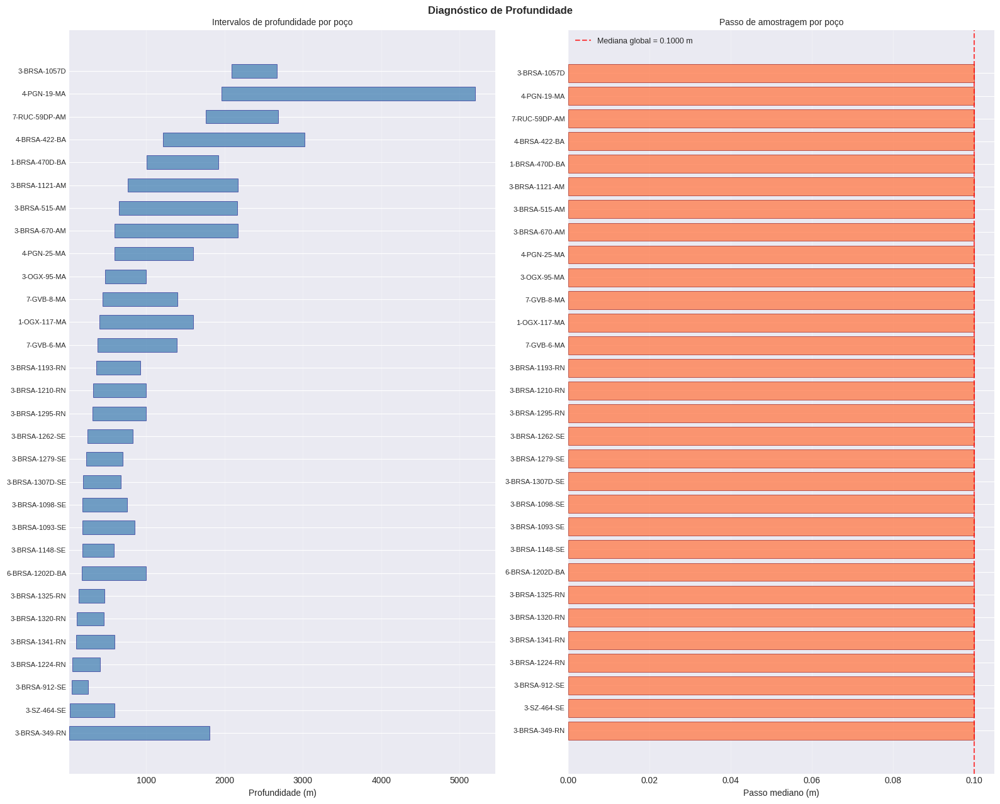

✓ Todos os poços têm profundidade monótona crescente.


In [6]:

rows = []
for w, info in preproc_summary.items():
    rows.append({
        'Poço':          w,
        'Prof_min (m)':  round(info['depth_min'], 1)  if info['depth_min']  else None,
        'Prof_max (m)':  round(info['depth_max'], 1)  if info['depth_max']  else None,
        'Espessura (m)': round(info['depth_max'] - info['depth_min'], 1) if info['depth_min'] else None,
        'Δprof mediano': round(info['step_median'], 4) if info['step_median'] else None,
        'Monotônico':    info['monotonic'],
        'N linhas':      info['total_linhas'],
    })
df_depth = pd.DataFrame(rows).sort_values('Prof_min (m)').reset_index(drop=True)
display(df_depth)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, max(4, len(df_depth)*0.4+1)))
fig.patch.set_facecolor('white')

for i, row in df_depth.iterrows():
    if row['Prof_min (m)'] is not None:
        ax1.barh(i, row['Espessura (m)'], left=row['Prof_min (m)'],
                 height=0.6, color='steelblue', alpha=0.75, edgecolor='navy', linewidth=0.5)
ax1.set_yticks(range(len(df_depth))); ax1.set_yticklabels(df_depth['Poço'], fontsize=8)
ax1.set_xlabel('Profundidade (m)')
ax1.set_title('Intervalos de profundidade por poço', fontsize=10)
ax1.grid(axis='x', alpha=0.3)

steps = df_depth['Δprof mediano'].dropna()
pocos = df_depth.loc[steps.index, 'Poço']
ax2.barh(range(len(steps)), steps.values, color='coral', alpha=0.8, edgecolor='darkred', linewidth=0.5)
ax2.set_yticks(range(len(steps))); ax2.set_yticklabels(pocos, fontsize=8)
ax2.axvline(steps.median(), color='red', linestyle='--', alpha=0.7,
            label=f'Mediana global = {steps.median():.4f} m')
ax2.set_xlabel('Passo mediano (m)')
ax2.set_title('Passo de amostragem por poço', fontsize=10)
ax2.legend(fontsize=9); ax2.grid(axis='x', alpha=0.3)

plt.suptitle('Diagnóstico de Profundidade', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('diag_profundidade.png', dpi=150, bbox_inches='tight')
plt.show()

nao_mono = [w for w, info in preproc_summary.items() if not info['monotonic']]
if nao_mono:
    print(f'⚠️  Poços com profundidade não monótona: {nao_mono}')
else:
    print('✓ Todos os poços têm profundidade monótona crescente.')

### 5.1. Razão de comprimento entre poços

In [7]:

# ── Razão max(N,M)/min(N,M) entre todos os pares de poços ────────────────────
n_linhas_poco = {w: len(df) for w, df in df_dict_qc.items()}
wells_5c      = sorted(n_linhas_poco.keys())
n_vals_5c     = [n_linhas_poco[w] for w in wells_5c]

razoes_5c = []
for i in range(len(wells_5c)):
    for j in range(i+1, len(wells_5c)):
        ni, nj = n_vals_5c[i], n_vals_5c[j]
        razao  = max(ni, nj) / max(min(ni, nj), 1)
        razoes_5c.append({'poco_A': wells_5c[i], 'poco_B': wells_5c[j],
                           'N_A': ni, 'N_B': nj, 'razao_max_min': round(razao, 2)})

df_razoes_5c = pd.DataFrame(razoes_5c).sort_values('razao_max_min', ascending=False)

print('=== 5c — RAZÃO max(N,M) / min(N,M) ENTRE PARES DE POÇOS ===')
print(f'  Total de pares:         {len(razoes_5c)}')
print(f'  Percentil 50%:          {df_razoes_5c["razao_max_min"].quantile(0.50):.2f}')
print(f'  Percentil 90%:          {df_razoes_5c["razao_max_min"].quantile(0.90):.2f}')
print(f'  Máximo:                 {df_razoes_5c["razao_max_min"].max():.2f}')
print(f'  Pares com razão > 3:    {(df_razoes_5c["razao_max_min"] > 3).sum()}')
print(f'  Pares com razão > 5:    {(df_razoes_5c["razao_max_min"] > 5).sum()}')
print()
print('Top 8 pares com maior razão (maior risco de viés de comprimento):')
display(df_razoes_5c.head(8)[['poco_A','poco_B','N_A','N_B','razao_max_min']])

print()
print('→ Limitação para a dissertação:')
print('  Pares com razão > 3:1 têm distância DTW/(N+M) artificialmente reduzida.')
print('  A correlação Spearman entre dist/(N+M) e dist/min(N,M) é calculada')
print('  na Seção 10b, após as matrizes DTW estarem disponíveis.')

=== 5c — RAZÃO max(N,M) / min(N,M) ENTRE PARES DE POÇOS ===
  Total de pares:         435
  Percentil 50%:          1.77
  Percentil 90%:          4.03
  Máximo:                 15.56
  Pares com razão > 3:    87
  Pares com razão > 5:    26

Top 8 pares com maior razão (maior risco de viés de comprimento):


,poco_A,poco_B,N_A,N_B,razao_max_min
393,3-BRSA-912-SE,4-PGN-19-MA,2079,32339,15.56
338,3-BRSA-1325-RN,4-PGN-19-MA,3286,32339,9.84
324,3-BRSA-1320-RN,4-PGN-19-MA,3450,32339,9.37
239,3-BRSA-1224-RN,4-PGN-19-MA,3508,32339,9.22
392,3-BRSA-912-SE,4-BRSA-422-BA,2079,18099,8.71
359,3-BRSA-349-RN,3-BRSA-912-SE,17927,2079,8.62
176,3-BRSA-1148-SE,4-PGN-19-MA,4003,32339,8.08
380,3-BRSA-670-AM,3-BRSA-912-SE,15714,2079,7.56



→ Limitação para a dissertação:
  Pares com razão > 3:1 têm distância DTW/(N+M) artificialmente reduzida.
  A correlação Spearman entre dist/(N+M) e dist/min(N,M) é calculada
  na Seção 10b, após as matrizes DTW estarem disponíveis.


### 5.2. Verificação de grade intrapoço

In [8]:

print('=== VERIFICAÇÃO DE GRADE INTRAPOÇO (df_dict_z) ===')
print(f'{"Poço":<25} ', end='')
for v in VARS_PETROFISICAS:
    print(f'{v[:10]:<12}', end='')
print('  Max_Δn  Alerta')
print('-' * 100)

for well, df in df_dict_z.items():
    contagens = {}
    for v in VARS_PETROFISICAS:
        if v in df.columns:
            contagens[v] = int(df[v].notna().sum())
        else:
            contagens[v] = 0
    ns    = list(contagens.values())
    delta = max(ns) - min(ns) if ns else 0
    pct   = 100 * delta / max(ns) if max(ns) > 0 else 0
    alert = '⚠️  > 5%' if pct > 5 else '✓'
    print(f'{well:<25} ', end='')
    for v in VARS_PETROFISICAS:
        print(f'{contagens.get(v, 0):<12}', end='')
    print(f'  {delta:<7} {alert}  ({pct:.1f}%)')

print('\nInterpretação: Δn > 5% entre variáveis indica graus de cobertura distintos.')
print('O DTW intrapoço opera nas séries reais (sem interpolação); a discrepância')
print('deve ser reportada como limitação se Δn for elevado em muitos poços.')

=== VERIFICAÇÃO DE GRADE INTRAPOÇO (df_dict_z) ===
Poço                      GR (API)    RHO (g/cm³  PHI (dec)   PE (b/e)    DT (μs/ft)    Max_Δn  Alerta
----------------------------------------------------------------------------------------------------
1-BRSA-470D-BA            9195        9191        9195        9195        9195          4       ✓  (0.0%)
1-OGX-117-MA              11934       11484       11934       11934       11934         450     ✓  (3.8%)
3-BRSA-1057D              5738        5585        5738        5738        5738          153     ✓  (2.7%)
3-BRSA-1093-SE            6692        6692        6692        6692        6692          0       ✓  (0.0%)
3-BRSA-1121-AM            13983       13951       13983       13983       13983         32      ✓  (0.2%)
3-BRSA-1193-RN            5582        5582        5582        5582        5582          0       ✓  (0.0%)
3-BRSA-1210-RN            6746        6746        6746        6746        6746          0       ✓  (0.0%)
3-B

## 6. Núcleo DTW e métricas auxiliares

In [9]:

# ── Vetor de amplitudes físicas (mesma ordem de VARS_PETROFISICAS) ────────────
# Vetores para normalização min-max física (ordem de VARS_PETROFISICAS)
AMP_VEC = np.array([AMPLITUDES_FISICAS[v] for v in VARS_PETROFISICAS], dtype=float)
LO_VEC  = np.array([LO_FISICOS[v]         for v in VARS_PETROFISICAS], dtype=float)
print('Normalização min-max física — vetores:')
for v, lo, amp in zip(VARS_PETROFISICAS, LO_VEC, AMP_VEC):
    print(f'  {v}: (x - {lo}) / {amp}  →  ∈ [0, 1]')

# ── Funções de preparação ─────────────────────────────────────────────────────
def preparar_series(df, var1, var2, depth_col=DEPTH_COL):
    if not all(c in df.columns for c in [depth_col, var1, var2]):
        return None, None, None
    tmp = (df[[depth_col, var1, var2]]
           .dropna(subset=[depth_col, var1, var2])
           .sort_values(depth_col).reset_index(drop=True))
    if len(tmp) < 2:
        return None, None, None
    return tmp[var1].to_numpy(float), tmp[var2].to_numpy(float), tmp[depth_col].to_numpy(float)

def preparar_univariado(df, var):
    if not all(c in df.columns for c in [DEPTH_COL, var]):
        return None
    tmp = (df[[DEPTH_COL, var]]
           .apply(lambda s: pd.to_numeric(s, errors='coerce'))
           .dropna(subset=[DEPTH_COL, var])
           .sort_values(DEPTH_COL).reset_index(drop=True))
    return tmp[var].to_numpy(float) if len(tmp) >= 2 else None

def preparar_multivariado_normalizado(df):
    """
    Função mantida por compatibilidade histórica do notebook; a análise final deste arquivo
    é univariada.
    """
    if not all(c in df.columns for c in [DEPTH_COL] + VARS_PETROFISICAS):
        return None
    tmp = df[[DEPTH_COL] + VARS_PETROFISICAS].copy()
    tmp[DEPTH_COL] = pd.to_numeric(tmp[DEPTH_COL], errors='coerce')
    tmp = tmp.dropna(subset=[DEPTH_COL] + VARS_PETROFISICAS).sort_values(DEPTH_COL).reset_index(drop=True)
    if len(tmp) < 2:
        return None
    arr = tmp[VARS_PETROFISICAS].to_numpy(float)
    # Normalização correta: (x - lo) / (hi - lo) — projeção exata em [0, 1]
    # Apenas arr/AMP_VEC é incorreto quando lo ≠ 0 (RHO: lo=0.8; DT: lo=35; PE: lo=0)
    return (arr - LO_VEC) / AMP_VEC

# ── Funções DTW ────────────────────────────────────────────────────────────────
def dtw_distancia(s1, s2, band_frac=BAND_FRAC, norm='sumlen'):
    """
    DTW com banda de Sakoe–Chiba — implementação NumPy/Numba (DTW exato).

    Métricas locais:
      - Univariado (1-D): L1 — |xᵢ − yⱼ|
      - Multivariado (N-D): L2 — ‖xᵢ − yⱼ‖₂

    Parâmetros:
      s1, s2     : arrays 1-D (univariado) ou N×d (multivariado, já normalizados)
      band_frac  : fração de min(N,M) para a janela Sakoe–Chiba
      norm       : 'sumlen' → dist/(N+M) | 'minlen' → dist/min(N,M) | None → dist bruta

    Retorna: (dist_norm, dist_raw)
    """
    s1 = np.asarray(s1, dtype=np.float64)
    s2 = np.asarray(s2, dtype=np.float64)

    # Remover NaN/Inf
    if s1.ndim == 1:
        s1 = s1[np.isfinite(s1)]
        s2 = s2[np.isfinite(s2)]
    else:
        s1 = s1[np.all(np.isfinite(s1), axis=1)]
        s2 = s2[np.all(np.isfinite(s2), axis=1)]

    N, M = len(s1), len(s2)
    if N < 2 or M < 2:
        return np.nan, np.nan

    window = max(int(np.ceil(band_frac * min(N, M))), abs(N - M))

    if s1.ndim == 1:
        # Univariado: L1 — |xᵢ − yⱼ|
        dist_raw = _dtw_sc_1d(s1, s2, window)
    else:
        # Multivariado: L2 — ‖xᵢ − yⱼ‖₂
        dist_raw = _dtw_sc_nd(s1, s2, window)

    if norm == 'sumlen':
        dist_norm = float(dist_raw) / float(N + M)
    elif norm == 'minlen':
        dist_norm = float(dist_raw) / float(min(N, M))
    else:
        dist_norm = float(dist_raw)

    return float(dist_norm), float(dist_raw)


def dtw_warping_path(s1, s2, band_frac=BAND_FRAC):
    """
    Retorna o caminho de warping ótimo para visualização (heatmap intrapoço).
    Usa dtw.warping_path — apenas para séries univariadas.
    Nota: mais lento que distance_fast; usar apenas para visualização.
    """
    s1 = np.asarray(s1[np.isfinite(s1)], dtype=np.float64)
    s2 = np.asarray(s2[np.isfinite(s2)], dtype=np.float64)
    if len(s1) < 2 or len(s2) < 2:
        return None
    window = int(np.ceil(band_frac * min(len(s1), len(s2))))
    try:
        path = _dtw_path_1d_sc(s1, s2, window)
        return path
    except Exception:
        return None


# ── Validação de clustering ────────────────────────────────────────────────────
def silhouette_safe(D, labels, ignore_noise=False):
    """
    Silhouette com matriz pré-computada. Índice SECUNDÁRIO.
    Nota: Silhouette foi concebido em espaços euclidianos. Com distâncias DTW
    é interpretado como separação relativa, não geométrica.
    """
    D, labels = np.asarray(D, float), np.asarray(labels)
    if ignore_noise:
        mask = labels != -1
        if mask.sum() < 3:
            return np.nan
        D, labels = D[np.ix_(mask, mask)], labels[mask]
    u = [x for x in np.unique(labels) if x != -1]
    if len(u) < 2 or len(labels) < 2:
        return np.nan
    try:
        return float(silhouette_score(D, labels, metric='precomputed'))
    except Exception:
        return np.nan

def dunn_index(D, labels):
    """
    Índice de Dunn: min(dist intercluster) / max(diâmetro intracluster).
    Índice PRIMÁRIO — mais adequado que Silhouette para distâncias pré-computadas.
    Maior valor = melhor separação de clusters.
    Ruído DBSCAN (label == -1) filtrado de forma consistente.
    """
    D, labels = np.asarray(D, float), np.asarray(labels)
    mask = labels != -1
    if mask.sum() < 2:
        return np.nan
    D_filt      = D[np.ix_(mask, mask)]
    labels_filt = labels[mask]
    u           = np.unique(labels_filt)
    if len(u) < 2:
        return np.nan
    diameters = []
    for k in u:
        idx = np.where(labels_filt == k)[0]
        diameters.append(float(np.nanmax(D_filt[np.ix_(idx, idx)])) if len(idx) > 1 else 0.0)
    max_diam = max(diameters)
    if max_diam == 0 or not np.isfinite(max_diam):
        return np.nan
    min_inter = np.inf
    for i, ki in enumerate(u):
        for j, kj in enumerate(u):
            if i >= j: continue
            idx_i = np.where(labels_filt == ki)[0]
            idx_j = np.where(labels_filt == kj)[0]
            min_inter = min(min_inter, float(np.nanmin(D_filt[np.ix_(idx_i, idx_j)])))
    return float(min_inter / max_diam) if np.isfinite(min_inter) else np.nan

def medoid_index(D_arr, indices):
    """Medóide = ponto com menor soma de distâncias aos demais no cluster."""
    sub  = D_arr[np.ix_(indices, indices)]
    sums = np.nansum(sub, axis=1)
    return indices[np.argmin(sums)]


def davies_bouldin_medoid(D, labels):
    """
    Davies–Bouldin Index adaptado para distâncias DTW pré-computadas.

    Substituição metodológica: centróide euclidiano → medóide.
    s_i  = diâmetro médio intracluster i (média das distâncias DTW pares).
    d_ij = distância DTW pré-computada entre medóides de i e j.
    DBI  = média do pior caso de sobreposição: mean_i( max_{j≠i}( (s_i+s_j)/d_ij ) )

    Ruído DBSCAN (label -1) excluído.  Menor DBI = melhor separação.

    Ref: Davies & Bouldin (1979). IEEE TPAMI 1(2):224-227.
         Kaufman & Rousseeuw (1990). Finding Groups in Data. Wiley.
    """
    D_arr  = np.asarray(D, dtype=float)
    labels = np.asarray(labels)
    mask   = labels != -1
    if mask.sum() < 2:
        return np.nan
    idx_v    = np.where(mask)[0]
    D_f      = D_arr[np.ix_(idx_v, idx_v)]
    lf       = labels[mask]
    clusters = np.unique(lf)
    if len(clusters) < 2:
        return np.nan

    cidx = {k: np.where(lf == k)[0] for k in clusters}

    s = {}
    for k, idxs in cidx.items():
        if len(idxs) == 1:
            s[k] = 0.0
        else:
            sub  = D_f[np.ix_(idxs, idxs)]
            triu = sub[np.triu_indices(len(idxs), k=1)]
            s[k] = float(np.nanmean(triu)) if len(triu) > 0 else 0.0

    meds = {k: medoid_index(D_f, cidx[k]) for k in clusters}

    dbi_vals = []
    for i in clusters:
        ratios = []
        for j in clusters:
            if i == j: continue
            d_ij = float(D_f[meds[i], meds[j]])
            if d_ij > 0 and np.isfinite(d_ij):
                ratios.append((s[i] + s[j]) / d_ij)
        if ratios:
            dbi_vals.append(float(np.nanmax(ratios)))
    return float(np.nanmean(dbi_vals)) if dbi_vals else np.nan


def top2_pairs(M):
    names = list(M.index)
    cand  = [(float(M.iloc[i,j]), names[i], names[j])
             for i in range(len(names)) for j in range(i+1, len(names))
             if np.isfinite(M.iloc[i,j]) and M.iloc[i,j] > 0]
    return sorted(cand)[:2]



# ── Funções auxiliares globais ───────────────────────────────────────────────
# Definidas AQUI UMA ÚNICA VEZ. Não redefinir em células posteriores.

def sanitizar_matriz(D: np.ndarray, nome: str = '') -> np.ndarray:
    """
    Garante simetria, diagonal zero, ausência de NaN/Inf fora da diagonal
    e distâncias não-negativas.
    `nome` é usado apenas para mensagens de erro descritivas.
    """
    D = (np.asarray(D, float) + np.asarray(D, float).T) / 2.0
    np.fill_diagonal(D, 0.0)
    off = ~np.eye(D.shape[0], dtype=bool)
    if not np.all(np.isfinite(D[off])):
        raise ValueError(f'{nome}: NaN/Inf fora da diagonal.'.strip())
    if np.any(D[off] < 0):
        raise ValueError(f'{nome}: distâncias negativas.'.strip())
    return D


def slug(s: str) -> str:
    """Converte nome de variável em string segura para nome de arquivo."""
    result = str(s)
    for old, new in [
        ('/', '_'), (' ', '_'), ('(', ''), (')', ''),
        ('µ', 'u'), ('μ', 'u'), ('³', '3'), ('-', '_'),
        (':', '_'), ('\\', '_'), ('__', '_'),
    ]:
        result = result.replace(old, new)
    return result


def tabela_clusters(pocos: list, labels, col: str = 'cluster') -> pd.DataFrame:
    """DataFrame poço → rótulo de cluster, ordenado por cluster e nome."""
    return (pd.DataFrame({'poco': pocos, col: labels})
              .sort_values([col, 'poco'])
              .reset_index(drop=True))


print('\n✓ Funções DTW + validação + auxiliares definidas (única vez).')
print('  Univariado  : _dtw_sc_1d               → L1, SC estrita (NumPy/Numba)')
print('  Multivariado: _dtw_sc_nd               → L2 em Rⁿ, SC estrita (NumPy/Numba)')
print('  Visualização: _dtw_path_1d_sc          → caminho ótimo (matriz completa)')
print('  Janela efetiva: max(ceil(BAND_FRAC*min(N,M)), |N-M|)')
print('  Banda SC    : {int(BAND_FRAC*100)}% de min(N,M)')
print('  Validação   : dunn_index | davies_bouldin_medoid | silhouette_safe')
print('  Auxiliares  : sanitizar_matriz | slug | tabela_clusters | top2_pairs')

Normalização min-max física — vetores:
  GR (API): (x - 0.0) / 500.0  →  ∈ [0, 1]
  RHO (g/cm³): (x - 0.8) / 3.2  →  ∈ [0, 1]
  PHI (dec): (x - 0.0) / 1.0  →  ∈ [0, 1]
  PE (b/e): (x - 0.0) / 20.0  →  ∈ [0, 1]
  DT (μs/ft): (x - 35.0) / 215.0  →  ∈ [0, 1]

✓ Funções DTW + validação + auxiliares definidas (única vez).
  Univariado  : _dtw_sc_1d               → L1, SC estrita (NumPy/Numba)
  Multivariado: _dtw_sc_nd               → L2 em Rⁿ, SC estrita (NumPy/Numba)
  Visualização: _dtw_path_1d_sc          → caminho ótimo (matriz completa)
  Janela efetiva: max(ceil(BAND_FRAC*min(N,M)), |N-M|)
  Banda SC    : {int(BAND_FRAC*100)}% de min(N,M)
  Validação   : dunn_index | davies_bouldin_medoid | silhouette_safe
  Auxiliares  : sanitizar_matriz | slug | tabela_clusters | top2_pairs


## 7. DTW intrapoço

In [10]:

dtw_matrices_intra = {}
OUTDIR_INTRA       = 'plots_intra'
os.makedirs(OUTDIR_INTRA, exist_ok=True)

for well_name, df in df_dict_z.items():
    n   = len(VARS_PETROFISICAS)
    mat = np.full((n, n), np.nan)
    np.fill_diagonal(mat, 0.0)
    for i in range(n):
        for j in range(i+1, n):
            v1, v2 = VARS_PETROFISICAS[i], VARS_PETROFISICAS[j]
            x, y, _ = preparar_series(df, v1, v2)
            if x is None: continue
            d_norm, _ = dtw_distancia(x, y)
            mat[i, j] = mat[j, i] = d_norm
    dtw_matrices_intra[well_name] = pd.DataFrame(mat, index=VARS_PETROFISICAS, columns=VARS_PETROFISICAS)

print('✓ DTW intrapoço calculado.')
print(f'  Dataset: df_dict_z | Métrica interna: L1 | Janela SC: {int(BAND_FRAC*100)}% | {len(dtw_matrices_intra)} poços')
print(f"\nMatriz de distâncias DTW NORMALIZADA — poço {well_name}:")
print(dtw_matrices_intra[well_name])

for w, M in dtw_matrices_intra.items():
    print("\n" + "="*90)
    print(f"Poço: {w}")
    print(M)

# ── Heatmaps intrapoço — DTW(rank) em caixinha dentro da imagem ─────────────


OUTDIR_INTRA = OUTDIR_INTRA if "OUTDIR_INTRA" in globals() else "plots_intra_heatmaps"
os.makedirs(OUTDIR_INTRA, exist_ok=True)


for well_name in dtw_matrices_intra:
    if well_name not in df_dict_z:
        continue

    M     = dtw_matrices_intra[well_name]
    df    = df_dict_z[well_name]
    pares = top2_pairs(M)
    if not pares:
        continue

    fig, axes = plt.subplots(1, len(pares), figsize=(16, 7))
    if len(pares) == 1:
        axes = [axes]
    fig.patch.set_facecolor('white')

    for idx, (d_rank, var1, var2) in enumerate(pares):
        ax = axes[idx]
        x, y, _ = preparar_series(df, var1, var2)
        if x is None or len(x) < 2 or len(y) < 2:
            ax.axis('off')
            continue

        # Subsample para visualização (máx 1500 pontos)
        MAX_N = 1500
        xp = x[np.linspace(0, len(x)-1, min(len(x), MAX_N)).astype(int)]
        yp = y[np.linspace(0, len(y)-1, min(len(y), MAX_N)).astype(int)]

        path = dtw_warping_path(xp, yp, band_frac=BAND_FRAC)

        custo = np.abs(xp[:, None] - yp[None, :])
        im    = ax.imshow(custo, aspect='auto', origin='lower',
                          cmap='turbo', interpolation='nearest')

        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04).set_label(
            '|x_i - y_j| (padronizado)', rotation=270, labelpad=15
        )

        # Caminho DTW
        if path is not None:
            ax.plot([p[1] for p in path], [p[0] for p in path],
                    color='white', linewidth=1.8, alpha=0.9, zorder=5)

        # === CAIXINHA com DTW(rank) dentro da imagem ===
        txt = f"DTW(rank) = {d_rank:.4f}"
        ax.text(
            0.98, 0.98, txt,
            transform=ax.transAxes,
            ha="right", va="top",
            fontsize=10,
            zorder=10,
            bbox=dict(
                boxstyle="round,pad=0.25",
                facecolor="white",
                edgecolor="black",
                linewidth=0.8,
                alpha=0.90
            )
        )

        ax.set_xlabel(f'Índice {var2}', fontsize=10)
        ax.set_ylabel(f'Índice {var1}', fontsize=10)

    fig.suptitle(
        f'Poço {well_name} — DTW intrapoço (padronizado) | Sakoe–Chiba {int(BAND_FRAC*100)}%',
        fontsize=13, fontweight='bold'
    )
    plt.tight_layout()
    fig.savefig(os.path.join(OUTDIR_INTRA, f'{well_name}_intra_heatmap.png'),
                dpi=150, bbox_inches='tight', facecolor='white')
    plt.close(fig)

print(f'✓ Heatmaps intrapoço salvos em {OUTDIR_INTRA}')

# ── Séries sobrepostas por profundidade (intrapoço) — título com DTW(rank) ──
import os
import matplotlib.pyplot as plt

OUTDIR_SERIES = "plots_intra_series"
os.makedirs(OUTDIR_SERIES, exist_ok=True)

def plot_top2_series(well_name, df_dict, dtw_matrices_dict,
                     depth_col=DEPTH_COL, outdir=OUTDIR_SERIES):
    if well_name not in dtw_matrices_dict or well_name not in df_dict:
        return

    pares = top2_pairs(dtw_matrices_dict[well_name])
    if not pares:
        return

    df      = df_dict[well_name]
    n_pairs = len(pares)

    fig, axes = plt.subplots(n_pairs, 1, figsize=(12, 4 * n_pairs))
    fig.patch.set_facecolor('white')
    if n_pairs == 1:
        axes = [axes]

    for i, (dist, v1, v2) in enumerate(pares):
        ax = axes[i]
        x_arr, y_arr, depth_arr = preparar_series(df, v1, v2, depth_col)
        if x_arr is None or len(depth_arr) < 2:
            ax.axis('off')
            continue

        ax.plot(depth_arr, x_arr, label=v1, linewidth=1.0)
        ax.plot(depth_arr, y_arr, label=v2, linewidth=1.0)

        ax.set_xlabel(f'{depth_col}')
        ax.set_ylabel('padronizado')
        ax.grid(True, alpha=0.25)
        ax.set_facecolor('white')
        ax.legend(loc='upper right')

        # título com DTW(rank) + SC
        ax.set_title(
            f'{v1} × {v2}  |  DTW(rank) = {dist:.4f}',
            fontsize=11
        )

    fig.suptitle(f'Poço {well_name}', fontsize=14, y=0.98)
    fig.tight_layout(rect=[0, 0, 1, 0.96])

    out_path = os.path.join(outdir, f'{well_name}__top2_series.png')
    fig.savefig(out_path, dpi=200, bbox_inches='tight', facecolor='white')
    plt.close(fig)
    print(f'  [OK] {well_name} → {out_path}')


print("Gerando séries...")
for well_name in dtw_matrices_intra.keys():
    plot_top2_series(
        well_name=well_name,
        df_dict=df_dict_z,
        dtw_matrices_dict=dtw_matrices_intra
    )
print('✓ Séries geradas.')

✓ DTW intrapoço calculado.
  Dataset: df_dict_z | Métrica interna: L1 | Janela SC: 10% | 30 poços

Matriz de distâncias DTW NORMALIZADA — poço 7-RUC-59DP-AM:
             GR (API)  RHO (g/cm³)  PHI (dec)  PE (b/e)  DT (μs/ft)
GR (API)     0.000000     0.241172   0.123319  0.298371    0.132054
RHO (g/cm³)  0.241172     0.000000   0.290695  0.219412    0.301100
PHI (dec)    0.123319     0.290695   0.000000  0.283083    0.104160
PE (b/e)     0.298371     0.219412   0.283083  0.000000    0.316983
DT (μs/ft)   0.132054     0.301100   0.104160  0.316983    0.000000

Poço: 1-BRSA-470D-BA
             GR (API)  RHO (g/cm³)  PHI (dec)  PE (b/e)  DT (μs/ft)
GR (API)     0.000000     0.156691   0.273008  0.337891    0.213543
RHO (g/cm³)  0.156691     0.000000   0.256158  0.268161    0.172131
PHI (dec)    0.273008     0.256158   0.000000  0.117246    0.172207
PE (b/e)     0.337891     0.268161   0.117246  0.000000    0.209878
DT (μs/ft)   0.213543     0.172131   0.172207  0.209878    0.000000

Poç

## 8. DTW interpoços univariado

In [11]:

resultados_uni = {}
for var in VARS_PETROFISICAS:
    # Usa df_dict_zglobal (Z-score global) para capturar similaridade de forma
    wells  = list(df_dict_zglobal.keys())
    series = {w: preparar_univariado(df_dict_zglobal[w], var) for w in wells}
    valid  = [w for w in wells if series[w] is not None]
    m      = len(valid)
    D      = np.full((m, m), np.nan); np.fill_diagonal(D, 0.0)
    for i in range(m):
        for j in range(i+1, m):
            d_norm, _ = dtw_distancia(series[valid[i]], series[valid[j]])
            D[i, j] = D[j, i] = d_norm
    resultados_uni[var] = pd.DataFrame(D, index=valid, columns=valid)
    print(f'✓ {var}: {m} poços processados')

print('\nDTW univariado interpoços concluído.')
print(f'  Dataset: df_dict_zglobal (Z-score global) | Métrica: L1 | Janela SC: {int(BAND_FRAC*100)}% | Norm: (N+M)')

✓ GR (API): 30 poços processados
✓ RHO (g/cm³): 30 poços processados
✓ PHI (dec): 30 poços processados
✓ PE (b/e): 30 poços processados
✓ DT (μs/ft): 30 poços processados

DTW univariado interpoços concluído.
  Dataset: df_dict_zglobal (Z-score global) | Métrica: L1 | Janela SC: 10% | Norm: (N+M)


### 8.1. Heatmaps interpoços

In [12]:
import os, math, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

OUTDIR_UNI = 'plots_crosswell_heatmaps/univariado'
os.makedirs(OUTDIR_UNI, exist_ok=True)

# Ordem manual dos estados usada na defesa/dissertação.
# Se quiser ordem alfabética por sigla, basta deixar como None.
ESTADO_ORDEM = ['AM', 'MA', 'RN', 'SE', 'BA']

def slug(txt):
    s = str(txt)
    for old, new in [(' ','_'),('/','_'),('(',''),(')',''),(chr(181),'u'),
                     (chr(179),'3'),('-','_'),('__','_'),(chr(956),'u')]:
        s = s.replace(old, new)
    return s

def extrair_estado(nome_poco):
    """
    Extrai a sigla do estado a partir do nome do poço.
    Exemplos:
      3-BRSA-1224-RN -> RN
      1_OGX_117_MA   -> MA
    """
    nome = str(nome_poco).strip().upper()

    m = re.search(r'[-_]([A-Z]{2})$', nome)
    if m:
        return m.group(1)

    partes = re.split(r'[-_]', nome)
    if partes and len(partes[-1]) == 2 and partes[-1].isalpha():
        return partes[-1]

    return 'ZZ'

def ordenar_pocos_por_estado(rotulos, ordem_estados=ESTADO_ORDEM):
    """
    Ordena por:
      1) ordem manual dos estados (se fornecida),
      2) sigla do estado,
      3) nome completo do poço.
    """
    if ordem_estados is None:
        ranking = {}
    else:
        ranking = {uf: i for i, uf in enumerate(ordem_estados)}

    return sorted(
        list(rotulos),
        key=lambda x: (
            ranking.get(extrair_estado(x), 999),
            extrair_estado(x),
            str(x)
        )
    )

def reordenar_matriz_por_estado(D_df, ordem_estados=ESTADO_ORDEM):
    """
    Reordena linhas e colunas de uma matriz quadrada DataFrame
    segundo a sigla do estado extraída do nome do poço.
    """
    if not isinstance(D_df, pd.DataFrame):
        raise TypeError('D_df deve ser um pandas.DataFrame.')
    ordem = ordenar_pocos_por_estado(D_df.index.tolist(), ordem_estados=ordem_estados)
    return D_df.loc[ordem, ordem]

def preparar_matriz_para_plot(D_input, ordenar=True, ordem_estados=ESTADO_ORDEM):
    if isinstance(D_input, pd.DataFrame):
        D_df = D_input.copy()
        if ordenar:
            D_df = reordenar_matriz_por_estado(D_df, ordem_estados=ordem_estados)
        pocos = list(D_df.index)
        D     = sanitizar_matriz(D_df.to_numpy(float))
    else:
        D     = sanitizar_matriz(D_input)
        pocos = [f'P{i+1}' for i in range(D.shape[0])]
    return D, pocos

def salvar_heatmap_df(
    D_input, title, outdir, filename,
    cmap='viridis_r', ordenar=True,
    mostrar_diagonal=True, dpi=300, salvar_pdf=True,
    ordem_estados=ESTADO_ORDEM,
):
    if D_input is None:
        return
    D, pocos = preparar_matriz_para_plot(
        D_input,
        ordenar=ordenar,
        ordem_estados=ordem_estados,
    )
    if D.shape[0] < 2:
        return

    mat = D.copy()
    if not mostrar_diagonal:
        np.fill_diagonal(mat, np.nan)
        vals = mat[np.isfinite(mat)]
        vmin = float(np.min(vals)) if vals.size else 0.0
        vmax = float(np.max(vals)) if vals.size else 1.0
    else:
        vmin, vmax = 0.0, float(np.nanmax(mat)) if mat.size else 1.0

    n = len(pocos)
    fig_w = max(7, 0.30 * n + 3.5)
    fig_h = max(6, 0.28 * n + 2.0)
    tick_fs = max(6, min(10, 14 - n // 5))

    fig, ax = plt.subplots(figsize=(fig_w, fig_h))
    fig.patch.set_facecolor('white')
    ax.set_facecolor('white')

    im = ax.imshow(mat, cmap=cmap, origin='upper', aspect='equal',
                   vmin=vmin, vmax=vmax, interpolation='nearest')
    cbar = fig.colorbar(im, ax=ax, fraction=0.035, pad=0.03, shrink=0.85)
    cbar.set_label('Distância DTW normalizada', rotation=270,
                   labelpad=18, fontsize=10)
    cbar.ax.tick_params(labelsize=9)
    cbar.outline.set_linewidth(0.5)

    ax.set_xticks(np.arange(n))
    ax.set_xticklabels(pocos, rotation=75, ha='right', fontsize=tick_fs)
    ax.set_yticks(np.arange(n))
    ax.set_yticklabels(pocos, fontsize=tick_fs)
    ax.set_xticks(np.arange(-0.5, n, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, n, 1), minor=True)
    ax.grid(which='minor', color='white', linestyle='-', linewidth=0.8, alpha=0.8)
    ax.tick_params(which='minor', bottom=False, left=False)

    for spine in ax.spines.values():
        spine.set_visible(False)

    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)
    plt.tight_layout(pad=1.2)

    png_path = os.path.join(outdir, filename)
    fig.savefig(png_path, dpi=dpi, bbox_inches='tight', facecolor='white')
    if salvar_pdf:
        pdf_path = os.path.join(outdir, os.path.splitext(filename)[0] + '.pdf')
        fig.savefig(pdf_path, bbox_inches='tight', facecolor='white')
    plt.close(fig)

for var, D_var in resultados_uni.items():
    fname = f'crosswell_dtw_univariado_{slug(var)}.png'
    salvar_heatmap_df(
        D_input=D_var,
        title=f'DTW entre poços — {var} (univariado, Z-score global)',
        outdir=OUTDIR_UNI,
        filename=fname,
        cmap='viridis_r',
        ordenar=True,
        ordem_estados=ESTADO_ORDEM,
        salvar_pdf=True,
    )

print(f'Heatmaps univariados salvos em {OUTDIR_UNI}')
if ESTADO_ORDEM is None:
    print('Ordem dos poços no heatmap: alfabética por sigla do estado.')
else:
    print(f'Ordem manual dos estados aplicada aos heatmaps: {ESTADO_ORDEM}')


Heatmaps univariados salvos em plots_crosswell_heatmaps/univariado
Ordem manual dos estados aplicada aos heatmaps: ['AM', 'MA', 'RN', 'SE', 'BA']


### 8.2. Pares mais similares por variável

In [13]:

OUTDIR_UNI_TOP5 = "plots_series/univariado_top5_pares"
os.makedirs(OUTDIR_UNI_TOP5, exist_ok=True)

def topk_pairs_from_distance_df(D: pd.DataFrame, k=5):
    A = D.to_numpy(float)
    names = list(D.index)
    pairs = []
    for i in range(len(names)):
        for j in range(i + 1, len(names)):
            if np.isfinite(A[i, j]) and A[i, j] > 0:
                pairs.append((float(A[i, j]), names[i], names[j]))
    return sorted(pairs)[:k]

def plotar_par_univariado(df1, df2, w1, w2, var, dist, outdir, depth_col=DEPTH_COL):
    cols = [depth_col, var]
    if not all(c in df1.columns for c in cols) or not all(c in df2.columns for c in cols):
        return
    a = df1[cols].copy()
    b = df2[cols].copy()
    a[depth_col] = pd.to_numeric(a[depth_col], errors="coerce")
    a[var] = pd.to_numeric(a[var], errors="coerce")
    b[depth_col] = pd.to_numeric(b[depth_col], errors="coerce")
    b[var] = pd.to_numeric(b[var], errors="coerce")
    a = a.dropna().sort_values(depth_col)
    b = b.dropna().sort_values(depth_col)
    if len(a) < 2 or len(b) < 2:
        return

    fig, ax = plt.subplots(figsize=(7, 8))
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")
    ax.plot(a[var], a[depth_col], label=w1, linewidth=1.0)
    ax.plot(b[var], b[depth_col], label=w2, linewidth=1.0)
    ax.set_title(f"{var}\nDTW(rank) = {dist:.4f}", fontsize=12, fontweight="bold")
    ax.set_xlabel(var)
    ax.set_ylabel(depth_col)
    ax.invert_yaxis()
    ax.grid(True, alpha=0.25)
    ax.legend(loc="best", fontsize=8)
    plt.tight_layout()
    fname = f"{slug(var)}__{slug(w1)}__{slug(w2)}.png"
    fig.savefig(os.path.join(outdir, fname), dpi=150, bbox_inches="tight", facecolor="white")
    plt.close(fig)

df_dict_plot = df_dict_qc
for var in VARS_PETROFISICAS:
    if var not in resultados_uni:
        continue

    D_var = resultados_uni[var]
    if D_var is None or len(D_var) < 2:
        continue

    pairs = topk_pairs_from_distance_df(D_var, k=5)
    outdir_var = os.path.join(OUTDIR_UNI_TOP5, slug(var))
    os.makedirs(outdir_var, exist_ok=True)

    for dist, w1, w2 in pairs:
        if w1 not in df_dict_plot or w2 not in df_dict_plot:
            continue
        plotar_par_univariado(df_dict_plot[w1], df_dict_plot[w2], w1, w2, var, dist, outdir_var)

print(f"✓ Univariado: top 5 pares por variável salvos em {OUTDIR_UNI_TOP5}")

✓ Univariado: top 5 pares por variável salvos em plots_series/univariado_top5_pares


## 9. Preparação para clustering hierárquico

In [14]:
dtw_crosswell_dict = {}
for var, D in resultados_uni.items():
    D_ord = reordenar_matriz_por_estado(D, ordem_estados=ESTADO_ORDEM)
    dtw_crosswell_dict[var] = (D_ord.to_numpy(float), D_ord.index.tolist())

print(f'✓ dtw_crosswell_dict: {len(dtw_crosswell_dict)} entradas univariadas')
for k, (D, pocos) in dtw_crosswell_dict.items():
    triu = D[np.triu_indices_from(D, k=1)]
    triu = triu[np.isfinite(triu)]
    print(f'  {k}: {len(pocos)} poços | dist [{triu.min():.4f}, {triu.max():.4f}] | média={triu.mean():.4f}')

# ── Funções do clustering hierárquico ───────────────────────────────────────
# sanitizar_matriz, dunn_index, silhouette_safe, davies_bouldin_medoid,
# tabela_clusters estão definidas na Seção 6 (célula única).

os.makedirs(OUTDIR_CLUSTER, exist_ok=True)

def escolher_ligacao(D: np.ndarray) -> pd.DataFrame:
    """
    Avalia single, complete, average e weighted via coeficiente cofenético.
    Retorna DataFrame ordenado (melhor ligação na linha 0).
    Ward excluído: distâncias DTW não satisfazem a desigualdade de
    paralelogramo necessária para a decomposição SSW. (Lemire, 2009)
    """
    y    = squareform(D, checks=False)
    rows = []
    for method in ['single', 'complete', 'average', 'weighted']:
        coph, _ = cophenet(linkage(y, method=method), y)
        rows.append({'ligacao': method, 'coef_cophenetico': round(float(coph), 4)})
    return pd.DataFrame(rows).sort_values('coef_cophenetico', ascending=False).reset_index(drop=True)

def plot_dendrograma_com_corte(
    D: np.ndarray, var: str, method: str,
    pocos: list, k_final: int, outdir: str,
) -> None:
    """Dendrograma simples com linha de corte (diagnóstico rápido)."""
    Z        = linkage(squareform(D, checks=False), method=method)
    labels_k = fcluster(Z, t=k_final, criterion='maxclust') - 1
    palette  = plt.cm.tab10.colors

    fig, ax = plt.subplots(figsize=(14, 5))
    fig.patch.set_facecolor('white')
    dendrogram(Z, labels=pocos, leaf_rotation=90, ax=ax,
               link_color_func=lambda k: '#444444')
    ax.set_title(
        f'Dendrograma — {var} | ligação: {method} | k_final = {k_final}',
        fontsize=12, fontweight='bold'
    )
    ax.set_ylabel('Distância DTW normalizada')

    dists = np.sort(Z[:, 2])
    if k_final < len(dists):
        cut_h = (dists[-k_final] + dists[-k_final + 1]) / 2
    else:
        cut_h = dists[-k_final] * 1.05
    ax.axhline(cut_h, color='red', linestyle='--', linewidth=1.5,
               label=f'Corte k={k_final}')
    ax.legend(fontsize=9)
    plt.tight_layout()
    fname = os.path.join(outdir, f'dendro_{slug(var)}.png')
    plt.savefig(fname, dpi=150, bbox_inches='tight')
    plt.show()

print('✓ Funções de clustering definidas (escolher_ligacao, plot_dendrograma_com_corte).')
print('  Ward excluído: distâncias DTW não satisfazem desigualdade de paralelogramo.')


✓ dtw_crosswell_dict: 5 entradas univariadas
  GR (API): 30 poços | dist [0.0269, 0.5699] | média=0.2500
  RHO (g/cm³): 30 poços | dist [0.0485, 1.0340] | média=0.3052
  PHI (dec): 30 poços | dist [0.0461, 1.0314] | média=0.2778
  PE (b/e): 30 poços | dist [0.0479, 1.0789] | média=0.2989
  DT (μs/ft): 30 poços | dist [0.0297, 1.2646] | média=0.3125
✓ Funções de clustering definidas (escolher_ligacao, plot_dendrograma_com_corte).
  Ward excluído: distâncias DTW não satisfazem desigualdade de paralelogramo.


## 10. Clustering hierárquico principal

In [15]:

def rodar_hierarquico_dtw(
    dtw_crosswell_dict,
    gerar_graficos=True,
    outdir=OUTDIR_CLUSTER,
):
    """
    Pipeline principal: clustering hierárquico sobre matriz DTW.
    DBSCAN e tuning de banda ficam fora deste notebook principal.
    """
    os.makedirs(outdir, exist_ok=True)
    resultados, resumo = {}, []

    for var, (D_raw, pocos) in dtw_crosswell_dict.items():
        print('\n' + '='*70)
        print(f'Variável: {var}')
        print('='*70)
        t0 = time.time()

        try:
            D = sanitizar_matriz(D_raw, var)
            pocos = list(pocos)
            if len(pocos) < 3:
                raise ValueError(f'Menos de 3 poços ({len(pocos)}).')

            triu = D[np.triu_indices_from(D, k=1)]
            triu = triu[np.isfinite(triu)]
            print(f'Poços: {len(pocos)} | dist: min={triu.min():.4f} | max={triu.max():.4f} | média={triu.mean():.4f}')

            df_lig = escolher_ligacao(D)
            method_best = df_lig.loc[0, 'ligacao']
            coph_best = float(df_lig.loc[0, 'coef_cophenetico'])
            Z = linkage(squareform(D, checks=False), method=method_best)

            # if gerar_graficos:
            #     plot_dendrograma(D, var, method_best, pocos, outdir)

            tempo = time.time() - t0
            resultados[var] = {
                'matriz_dtw': D,
                'pocos': pocos,
                'hier': {
                    'method': method_best,
                    'coph': coph_best,
                    'Z': Z,
                    'df_ligacoes': df_lig,
                },
                'tempo_s': tempo
            }

            resumo.append({
                'variavel': var,
                'n_pocos': len(pocos),
                'hier_ligacao': method_best,
                'hier_coph': round(coph_best, 4),
                'dist_min': round(float(np.min(triu)), 4),
                'dist_mean': round(float(np.mean(triu)), 4),
                'dist_max': round(float(np.max(triu)), 4),
                'tempo_s': round(float(tempo), 2),
            })

            print(f'Ligação selecionada: {method_best} | cofenético = {coph_best:.4f}')
            display(df_lig)

        except Exception as e:
            resultados[var] = {'erro': str(e)}
            resumo.append({
                'variavel': var,
                'n_pocos': len(pocos) if 'pocos' in locals() else None,
                'hier_ligacao': None,
                'hier_coph': None,
                'dist_min': None,
                'dist_mean': None,
                'dist_max': None,
                'tempo_s': None,
                'erro': str(e),
            })
            print(f'Erro em {var}: {e}')

    return resultados, pd.DataFrame(resumo)

resultados_hier, resumo_hier = rodar_hierarquico_dtw(
    dtw_crosswell_dict = dtw_crosswell_dict,
    gerar_graficos = True,
    outdir = OUTDIR_CLUSTER,
)

print('\n=== RESUMO DO CLUSTERING HIERÁRQUICO PRINCIPAL ===')
display(resumo_hier)


Variável: GR (API)
Poços: 30 | dist: min=0.0269 | max=0.5699 | média=0.2500
Ligação selecionada: average | cofenético = 0.7093


,ligacao,coef_cophenetico
0,average,0.7093
1,weighted,0.6587
2,single,0.6134
3,complete,0.6073



Variável: RHO (g/cm³)
Poços: 30 | dist: min=0.0485 | max=1.0340 | média=0.3052
Ligação selecionada: average | cofenético = 0.7130


,ligacao,coef_cophenetico
0,average,0.7130
1,weighted,0.6901
2,single,0.5655
3,complete,0.5311



Variável: PHI (dec)
Poços: 30 | dist: min=0.0461 | max=1.0314 | média=0.2778
Ligação selecionada: average | cofenético = 0.7949


,ligacao,coef_cophenetico
0,average,0.7949
1,weighted,0.7823
2,complete,0.7485
3,single,0.5189



Variável: PE (b/e)
Poços: 30 | dist: min=0.0479 | max=1.0789 | média=0.2989
Ligação selecionada: average | cofenético = 0.6079


,ligacao,coef_cophenetico
0,average,0.6079
1,weighted,0.5580
2,complete,0.5520
3,single,0.4752



Variável: DT (μs/ft)
Poços: 30 | dist: min=0.0297 | max=1.2646 | média=0.3125
Ligação selecionada: average | cofenético = 0.7015


,ligacao,coef_cophenetico
0,average,0.7015
1,weighted,0.7003
2,complete,0.6917
3,single,0.4839



=== RESUMO DO CLUSTERING HIERÁRQUICO PRINCIPAL ===


,variavel,n_pocos,hier_ligacao,hier_coph,dist_min,dist_mean,dist_max,tempo_s
0,GR (API),30,average,0.7093,0.0269,0.2500,0.5699,0.01
1,RHO (g/cm³),30,average,0.7130,0.0485,0.3052,1.0340,0.01
2,PHI (dec),30,average,0.7949,0.0461,0.2778,1.0314,0.01
3,PE (b/e),30,average,0.6079,0.0479,0.2989,1.0789,0.01
4,DT (μs/ft),30,average,0.7015,0.0297,0.3125,1.2646,0.01


## 11. Seleção de `k_final` por variável

**Regra única e transparente:**
1. Considera apenas soluções com `menor_cluster >= MIN_CLUSTER_SIZE` (= 4 poços)
2. Define o platô de Dunn em 95% do máximo
3. Dentro do platô, prioriza: menor DBI → maior Silhouette → menor k
4. Se nenhuma solução válida existe, reporta `sem_solucao_valida` — **nunca aceita silenciosamente**


In [16]:

def sensibilidade_k(resultados_hier, k_values=K_VALUES_INTERPOCOS, min_cluster_size=MIN_CLUSTER_SIZE):
    linhas = []
    melhores_linhas = []

    for var, info in resultados_hier.items():
        # Diagnóstico básico
        if not isinstance(info, dict):
            print(f"[AVISO] {var}: info não é dict.")
            continue

        if 'erro' in info:
            print(f"[AVISO] {var}: erro encontrado -> {info['erro']}")
            continue

        if 'matriz_dtw' not in info:
            print(f"[AVISO] {var}: sem 'matriz_dtw'.")
            continue

        if 'hier' not in info or 'Z' not in info['hier'] or 'method' not in info['hier']:
            print(f"[AVISO] {var}: estrutura hierárquica incompleta.")
            continue

        D = info['matriz_dtw']
        method = info['hier']['method']
        Z = info['hier']['Z']

        linhas_var = []

        for k in k_values:
            labels = fcluster(Z, t=k, criterion='maxclust') - 1

            n_clusters = len(np.unique(labels))
            if n_clusters < 2:
                sil = np.nan
                dun = np.nan
                dbi = np.nan
            else:
                sil = silhouette_safe(D, labels, ignore_noise=False)
                dun = dunn_index(D, labels)
                dbi = davies_bouldin_medoid(D, labels)

            u, c = np.unique(labels, return_counts=True)
            tamanhos = dict(zip(u.astype(int), c.astype(int)))

            menor_cluster = int(min(tamanhos.values())) if len(tamanhos) > 0 else 0
            valido = (n_clusters >= 2) and (menor_cluster >= min_cluster_size)

            linha = {
                'variavel': var,
                'ligacao': method,
                'k': int(k),
                'dunn': float(dun) if np.isfinite(dun) else np.nan,
                'dbi': float(dbi) if np.isfinite(dbi) else np.nan,
                'silhouette': float(sil) if np.isfinite(sil) else np.nan,
                'menor_cluster': menor_cluster,
                'valido': bool(valido),
                'tamanhos': str(tamanhos),
            }

            linhas.append(linha)
            linhas_var.append(linha)

        df_var = pd.DataFrame(linhas_var)

        if df_var.empty:
            print(f"[AVISO] {var}: nenhuma linha foi gerada.")
            continue

        cand = df_var[df_var['valido']].copy()
        if cand.empty:
            cand = df_var.copy()

        cand['dunn_ord'] = cand['dunn'].fillna(-np.inf)
        cand['dbi_ord'] = cand['dbi'].fillna(np.inf)
        cand['silhouette_ord'] = cand['silhouette'].fillna(-np.inf)

        best = cand.sort_values(
            ['dunn_ord', 'dbi_ord', 'silhouette_ord', 'k'],
            ascending=[False, True, False, True]
        ).iloc[0]

        melhores_linhas.append({
            'variavel': best['variavel'],
            'ligacao': best['ligacao'],
            'k': int(best['k']),
            'dunn': round(float(best['dunn']), 4) if pd.notna(best['dunn']) else np.nan,
            'dbi': round(float(best['dbi']), 4) if pd.notna(best['dbi']) else np.nan,
            'silhouette': round(float(best['silhouette']), 4) if pd.notna(best['silhouette']) else np.nan,
            'menor_cluster': int(best['menor_cluster']),
            'valido': bool(best['valido']),
            'tamanhos': best['tamanhos'],
        })

    df_full = pd.DataFrame(linhas)
    df_best = pd.DataFrame(melhores_linhas)

    return df_full, df_best

df_sens, df_best_k = sensibilidade_k(
    resultados_hier,
    k_values=K_VALUES_INTERPOCOS,
    min_cluster_size=MIN_CLUSTER_SIZE
)

print('Colunas de df_best_k:', df_best_k.columns.tolist())
print('Shape de df_best_k:', df_best_k.shape)

if df_best_k.empty:
    print("df_best_k ficou vazio. Verifique os avisos impressos acima.")
else:
    print('=== Sensibilidade a k — melhor k por variável (diagnóstico) ===')
    display(df_best_k[['variavel','ligacao','k','dunn','dbi','silhouette','menor_cluster','valido','tamanhos']])

# 1. Garantir a definição correta de sanitizar_matriz
def sanitizar_matriz(D: np.ndarray, nome: str = '') -> np.ndarray:
    D = (np.asarray(D, float) + np.asarray(D, float).T) / 2.0
    np.fill_diagonal(D, 0.0)
    off = ~np.eye(D.shape[0], dtype=bool)
    if not np.all(np.isfinite(D[off])):
        raise ValueError(f'{nome}: NaN/Inf fora da diagonal.'.strip())
    if np.any(D[off] < 0):
        raise ValueError(f'{nome}: distâncias negativas.'.strip())
    return D

# 2. Re-executar o clustering hierárquico principal
resultados_hier, resumo_hier = rodar_hierarquico_dtw(
    dtw_crosswell_dict = dtw_crosswell_dict,
    gerar_graficos = True,
    outdir = OUTDIR_CLUSTER,
)

# 3. Re-executar a análise de sensibilidade para gerar df_sens e df_best_k
df_sens, df_best_k = sensibilidade_k(resultados_hier, k_values=K_VALUES_INTERPOCOS, min_cluster_size=MIN_CLUSTER_SIZE)

print('\n--- Verificação de correção ---')
print(f'Variáveis processadas com sucesso: {len([v for v in resultados_hier.values() if "erro" not in v])}')
display(df_best_k.head())

def selecionar_k_final(
    df_sens,
    p_dunn=0.95,
    min_cluster_size=MIN_CLUSTER_SIZE,
    dunn_min_valido=DUNN_MIN_VALIDO,
    dunn_ganho_min=DUNN_GANHO_MIN,
):
    """
    Regra única e estrita de seleção de k_final — 4 passos em ordem:

    1. Considera apenas soluções com menor_cluster >= min_cluster_size.
       Se nenhuma existe, registra explicitamente 'sem_solucao_valida'
       e NÃO seleciona k_final para a análise principal.

    2. Define platô de Dunn: k onde Dunn >= p_dunn * max(Dunn).

    3. Verifica se existe k > k_plato com ganho de Dunn > dunn_ganho_min
       e que também satisfaça min_cluster_size. Se sim, prefere esse k.

    4. Dentro do conjunto final, prioriza: DBI ↓ → Silhouette ↑ → k ↓.

    Soluções com Dunn < dunn_min_valido são sinalizadas mas não descartadas.
    """
    rows = []
    for var, sub in df_sens.groupby('variavel'):
        sub = sub.copy()
        for col in ['k', 'dunn', 'dbi', 'silhouette', 'menor_cluster']:
            sub[col] = pd.to_numeric(sub[col], errors='coerce')

        # ── Passo 1: candidatos com tamanho mínimo estrito ───────────────────
        cand_validos = sub[sub['menor_cluster'] >= min_cluster_size].copy()
        if cand_validos.empty:
            rows.append({
                'variavel': var,
                'ligacao': None,
                'k_final': None,
                'dunn_k_final': None,
                'dbi_k_final': None,
                'silhouette_k_final': None,
                'menor_cluster_k_final': None,
                'regra_k': f'sem_solucao_valida (menor_cluster < {min_cluster_size} em todos os k)',
                'origem_selecao': 'sem_solucao_valida',
                'alerta_dunn': True,
            })
            continue

        cand = cand_validos.copy()
        origem = 'valido'

        # ── Passo 2: platô de Dunn ────────────────────────────────────────────
        dmax = cand['dunn'].max()
        if pd.isna(dmax) or dmax <= 0:
            rows.append({
                'variavel': var, 'ligacao': None, 'k_final': None,
                'dunn_k_final': None, 'dbi_k_final': None,
                'silhouette_k_final': None, 'menor_cluster_k_final': None,
                'regra_k': 'Dunn indisponível', 'origem_selecao': 'erro_dunn',
                'alerta_dunn': True,
            })
            continue

        plato = cand[cand['dunn'] >= p_dunn * dmax].copy()
        if plato.empty:
            plato = cand.copy()

        esc_plato = plato.sort_values(
            ['dbi', 'silhouette', 'k'], ascending=[True, False, True]
        ).iloc[0]
        dunn_plato = float(esc_plato['dunn'])
        k_plato    = int(esc_plato['k'])

        # ── Passo 3: ganho substancial de Dunn entre candidatos válidos ──────
        cand_maior = cand[
            (cand['k'] > k_plato) &
            (cand['dunn'] >= (1 + dunn_ganho_min) * dunn_plato)
        ].copy()

        if not cand_maior.empty:
            esc = cand_maior.sort_values(['dunn', 'k'], ascending=[False, True]).iloc[0]
            origem = origem + '_ganho_dunn'
        else:
            esc = esc_plato

        # ── Passo 4: sinalização de Dunn insuficiente ─────────────────────────
        dunn_final = float(esc['dunn']) if pd.notna(esc['dunn']) else 0.0
        alerta_dunn = dunn_final < dunn_min_valido

        rows.append({
            'variavel':              var,
            'ligacao':               esc['ligacao'],
            'k_final':               int(esc['k']),
            'dunn_k_final':          round(float(esc['dunn']), 4) if pd.notna(esc['dunn']) else None,
            'dbi_k_final':           round(float(esc['dbi']), 4) if pd.notna(esc['dbi']) else None,
            'silhouette_k_final':    round(float(esc['silhouette']), 4) if pd.notna(esc['silhouette']) else None,
            'menor_cluster_k_final': int(esc['menor_cluster']) if pd.notna(esc['menor_cluster']) else None,
            'regra_k':               f'platô_dunn_{int(p_dunn*100)}% + ganho>{int(dunn_ganho_min*100)}% → DBI ↓ → Sil ↑ → k ↓',
            'origem_selecao':        origem,
            'alerta_dunn':           alerta_dunn,
        })

    df = pd.DataFrame(rows).sort_values(
        ['dunn_k_final', 'dbi_k_final'], ascending=[False, True], na_position='last'
    ).reset_index(drop=True)

    print(f'\n=== Seleção de k_final ===')
    print(f'  MIN_CLUSTER_SIZE = {min_cluster_size} | DUNN_MIN_VALIDO = {dunn_min_valido} | DUNN_GANHO_MIN = {dunn_ganho_min}\n')

    sem_val = df[df['origem_selecao'].eq('sem_solucao_valida')]
    if not sem_val.empty:
        print('⚠ Sem solução válida para a análise principal:')
        for _, r in sem_val.iterrows():
            print(f'   • {r["variavel"]}: excluída do resultado principal (nenhum k com menor_cluster >= {min_cluster_size})')
        print()

    dunn_alert = df[(df['alerta_dunn'] == True) & df['k_final'].notna()]
    if not dunn_alert.empty:
        print(f'⚠ Dunn < {dunn_min_valido} (separação insuficiente — reportar como limitação):')
        for _, r in dunn_alert.iterrows():
            print(f'   • {r["variavel"]}: k_final={int(r["k_final"])} | Dunn={r["dunn_k_final"]:.3f}')
        print()

    ganho = df[df['origem_selecao'].str.contains('ganho_dunn', na=False)]
    if not ganho.empty:
        print(f'ℹ k elevado por ganho de Dunn > {int(dunn_ganho_min*100)}%:')
        for _, r in ganho.iterrows():
            print(f'   • {r["variavel"]}: k_final={int(r["k_final"])} | Dunn={r["dunn_k_final"]:.3f}')
        print()

    return df


df_k_final = selecionar_k_final(
    df_sens,
    p_dunn=0.95,
    min_cluster_size=MIN_CLUSTER_SIZE,
    dunn_min_valido=DUNN_MIN_VALIDO,
    dunn_ganho_min=DUNN_GANHO_MIN,
)

print('=== Tabela completa de seleção ===')
display(df_k_final[[
    'variavel','ligacao','k_final',
    'dunn_k_final','dbi_k_final','silhouette_k_final',
    'menor_cluster_k_final','origem_selecao','alerta_dunn'
]])

df_k_final_principal = df_k_final[df_k_final['k_final'].notna()].copy()
print('=== Variáveis mantidas no resultado principal ===')
display(df_k_final_principal[[
    'variavel','ligacao','k_final',
    'dunn_k_final','dbi_k_final','silhouette_k_final',
    'menor_cluster_k_final','origem_selecao','alerta_dunn'
]])

def materializar_resultado_final(resultados_hier, df_k_final):
    """Aplica k_final a cada variável e consolida resultados para a dissertação."""
    rows = []
    clusters_finais = {}

    for _, row in df_k_final.iterrows():
        var = row['variavel']
        if var not in resultados_hier or 'erro' in resultados_hier[var]:
            continue
        if row['k_final'] is None:
            continue

        info    = resultados_hier[var]
        D       = info['matriz_dtw']
        pocos   = info['pocos']
        Z       = info['hier']['Z']
        method  = info['hier']['method']
        k_final = int(row['k_final'])

        labels = fcluster(Z, t=k_final, criterion='maxclust') - 1
        sil    = silhouette_safe(D, labels, ignore_noise=False)
        dun    = dunn_index(D, labels)
        dbi    = davies_bouldin_medoid(D, labels)
        tab    = tabela_clusters(pocos, labels, 'cluster_final')

        clusters_finais[var] = {
            'matriz_dtw':  D,
            'pocos':       pocos,
            'ligacao':     method,
            'Z':           Z,
            'k_final':     k_final,
            'labels':      labels,
            'tabela':      tab,
            'dunn':        dun,
            'dbi':         dbi,
            'silhouette':  sil,
        }

        rows.append({
            'variavel':     var,
            'ligacao':      method,
            'k_final':      k_final,
            'Dunn ↑':       round(float(dun), 4) if np.isfinite(dun) else None,
            'DBI ↓':        round(float(dbi), 4) if np.isfinite(dbi) else None,
            'Silhouette ↑': round(float(sil), 4) if np.isfinite(sil) else None,
        })

    df_resumo = (pd.DataFrame(rows)
                 .sort_values('Dunn ↑', ascending=False)
                 .reset_index(drop=True))
    return clusters_finais, df_resumo


clusters_finais, df_resumo_final = materializar_resultado_final(resultados_hier, df_k_final_principal)

print('=== Tabela final consolidada ===')
display(df_resumo_final)

print('\n=== Composição dos clusters por variável ===')
for var, info in clusters_finais.items():
    print(f'\n{"="*80}')
    print(f'  {var}  |  ligação={info["ligacao"]}  |  k_final={info["k_final"]}')
    display(info['tabela'])

Colunas de df_best_k: ['variavel', 'ligacao', 'k', 'dunn', 'dbi', 'silhouette', 'menor_cluster', 'valido', 'tamanhos']
Shape de df_best_k: (5, 9)
=== Sensibilidade a k — melhor k por variável (diagnóstico) ===


,variavel,ligacao,k,dunn,dbi,silhouette,menor_cluster,valido,tamanhos
0,GR (API),average,8,0.5764,1.1982,0.2629,1,False,"{np.int64(0): np.int64(2), np.int64(1): np.int..."
1,RHO (g/cm³),average,2,0.3099,1.2848,0.4469,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."
2,PHI (dec),average,2,0.2422,0.9466,0.5879,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."
3,PE (b/e),average,2,0.1572,0.7827,0.3890,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."
4,DT (μs/ft),average,3,0.2369,1.0585,0.4240,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."



Variável: GR (API)
Poços: 30 | dist: min=0.0269 | max=0.5699 | média=0.2500
Ligação selecionada: average | cofenético = 0.7093


,ligacao,coef_cophenetico
0,average,0.7093
1,weighted,0.6587
2,single,0.6134
3,complete,0.6073



Variável: RHO (g/cm³)
Poços: 30 | dist: min=0.0485 | max=1.0340 | média=0.3052
Ligação selecionada: average | cofenético = 0.7130


,ligacao,coef_cophenetico
0,average,0.7130
1,weighted,0.6901
2,single,0.5655
3,complete,0.5311



Variável: PHI (dec)
Poços: 30 | dist: min=0.0461 | max=1.0314 | média=0.2778
Ligação selecionada: average | cofenético = 0.7949


,ligacao,coef_cophenetico
0,average,0.7949
1,weighted,0.7823
2,complete,0.7485
3,single,0.5189



Variável: PE (b/e)
Poços: 30 | dist: min=0.0479 | max=1.0789 | média=0.2989
Ligação selecionada: average | cofenético = 0.6079


,ligacao,coef_cophenetico
0,average,0.6079
1,weighted,0.5580
2,complete,0.5520
3,single,0.4752



Variável: DT (μs/ft)
Poços: 30 | dist: min=0.0297 | max=1.2646 | média=0.3125
Ligação selecionada: average | cofenético = 0.7015


,ligacao,coef_cophenetico
0,average,0.7015
1,weighted,0.7003
2,complete,0.6917
3,single,0.4839



--- Verificação de correção ---
Variáveis processadas com sucesso: 5


,variavel,ligacao,k,dunn,dbi,silhouette,menor_cluster,valido,tamanhos
0,GR (API),average,8,0.5764,1.1982,0.2629,1,False,"{np.int64(0): np.int64(2), np.int64(1): np.int..."
1,RHO (g/cm³),average,2,0.3099,1.2848,0.4469,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."
2,PHI (dec),average,2,0.2422,0.9466,0.5879,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."
3,PE (b/e),average,2,0.1572,0.7827,0.3890,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."
4,DT (μs/ft),average,3,0.2369,1.0585,0.4240,5,True,"{np.int64(0): np.int64(5), np.int64(1): np.int..."



=== Seleção de k_final ===
  MIN_CLUSTER_SIZE = 4 | DUNN_MIN_VALIDO = 0.25 | DUNN_GANHO_MIN = 0.1

⚠ Sem solução válida para a análise principal:
   • GR (API): excluída do resultado principal (nenhum k com menor_cluster >= 4)

⚠ Dunn < 0.25 (separação insuficiente — reportar como limitação):
   • PHI (dec): k_final=2 | Dunn=0.242
   • DT (μs/ft): k_final=2 | Dunn=0.228
   • PE (b/e): k_final=2 | Dunn=0.157

=== Tabela completa de seleção ===


,variavel,ligacao,k_final,dunn_k_final,dbi_k_final,silhouette_k_final,menor_cluster_k_final,origem_selecao,alerta_dunn
0,RHO (g/cm³),average,2.0,0.3099,1.2848,0.4469,5.0,valido,False
1,PHI (dec),average,2.0,0.2422,0.9466,0.5879,5.0,valido,True
2,DT (μs/ft),average,2.0,0.2277,0.4131,0.5265,5.0,valido,True
3,PE (b/e),average,2.0,0.1572,0.7827,0.3890,5.0,valido,True
4,GR (API),None,NaN,NaN,NaN,NaN,NaN,sem_solucao_valida,True


=== Variáveis mantidas no resultado principal ===


,variavel,ligacao,k_final,dunn_k_final,dbi_k_final,silhouette_k_final,menor_cluster_k_final,origem_selecao,alerta_dunn
0,RHO (g/cm³),average,2.0,0.3099,1.2848,0.4469,5.0,valido,False
1,PHI (dec),average,2.0,0.2422,0.9466,0.5879,5.0,valido,True
2,DT (μs/ft),average,2.0,0.2277,0.4131,0.5265,5.0,valido,True
3,PE (b/e),average,2.0,0.1572,0.7827,0.3890,5.0,valido,True


=== Tabela final consolidada ===


,variavel,ligacao,k_final,Dunn ↑,DBI ↓,Silhouette ↑
0,RHO (g/cm³),average,2,0.3099,1.2848,0.4469
1,PHI (dec),average,2,0.2422,0.9466,0.5879
2,DT (μs/ft),average,2,0.2277,0.4131,0.5265
3,PE (b/e),average,2,0.1572,0.7827,0.3890



=== Composição dos clusters por variável ===

  RHO (g/cm³)  |  ligação=average  |  k_final=2


,poco,cluster_final
0,3-BRSA-1057D,0
1,3-BRSA-1121-AM,0
2,3-BRSA-515-AM,0
3,3-BRSA-670-AM,0
4,7-RUC-59DP-AM,0
5,1-BRSA-470D-BA,1
6,1-OGX-117-MA,1
7,3-BRSA-1093-SE,1
8,3-BRSA-1098-SE,1
9,3-BRSA-1148-SE,1



  PHI (dec)  |  ligação=average  |  k_final=2


,poco,cluster_final
0,3-BRSA-1057D,0
1,3-BRSA-1121-AM,0
2,3-BRSA-515-AM,0
3,4-BRSA-422-BA,0
4,7-RUC-59DP-AM,0
5,1-BRSA-470D-BA,1
6,1-OGX-117-MA,1
7,3-BRSA-1093-SE,1
8,3-BRSA-1098-SE,1
9,3-BRSA-1148-SE,1



  DT (μs/ft)  |  ligação=average  |  k_final=2


,poco,cluster_final
0,3-BRSA-1057D,0
1,3-BRSA-1121-AM,0
2,3-BRSA-515-AM,0
3,3-BRSA-670-AM,0
4,7-RUC-59DP-AM,0
5,1-BRSA-470D-BA,1
6,1-OGX-117-MA,1
7,3-BRSA-1093-SE,1
8,3-BRSA-1098-SE,1
9,3-BRSA-1148-SE,1



  PE (b/e)  |  ligação=average  |  k_final=2


,poco,cluster_final
0,3-BRSA-1210-RN,0
1,3-BRSA-1224-RN,0
2,3-BRSA-1320-RN,0
3,3-BRSA-1325-RN,0
4,3-BRSA-1341-RN,0
5,1-BRSA-470D-BA,1
6,1-OGX-117-MA,1
7,3-BRSA-1057D,1
8,3-BRSA-1093-SE,1
9,3-BRSA-1098-SE,1


## 12. Dendrogramas coloridos com corte e séries

As figuras principais da dissertação passam a combinar:
1. dendrograma colorido com corte em `k_final`;
2. faixa de cor dos clusters na ordem das folhas;
3. séries apenas para visualização.

A reamostragem é usada somente para a figura e **não** altera o cálculo da DTW, que continua sendo feito nas séries originais.

Tipografia dissertacao configurada  (text.usetex=False)
  serif/CM | pdf.fonttype=42 | dpi_save=300
✓ altura_corte_para_k definida.
rcParams: ok (ver Celula 43)


  Salvo: dendrogramas_dissertacao/dendrograma_RHO_g_cm3_dissertacao.pdf


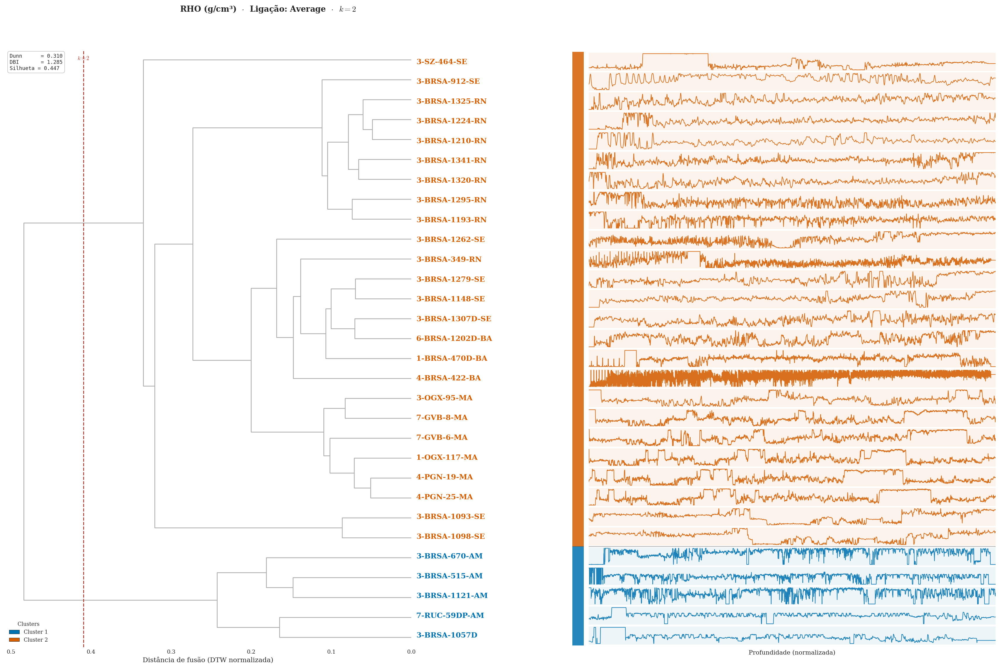

✓ Concluído: RHO (g/cm³)  →  dendrogramas_dissertacao/dendrograma_RHO_g_cm3_dissertacao.pdf


  Salvo: dendrogramas_dissertacao/dendrograma_PHI_dec_dissertacao.pdf


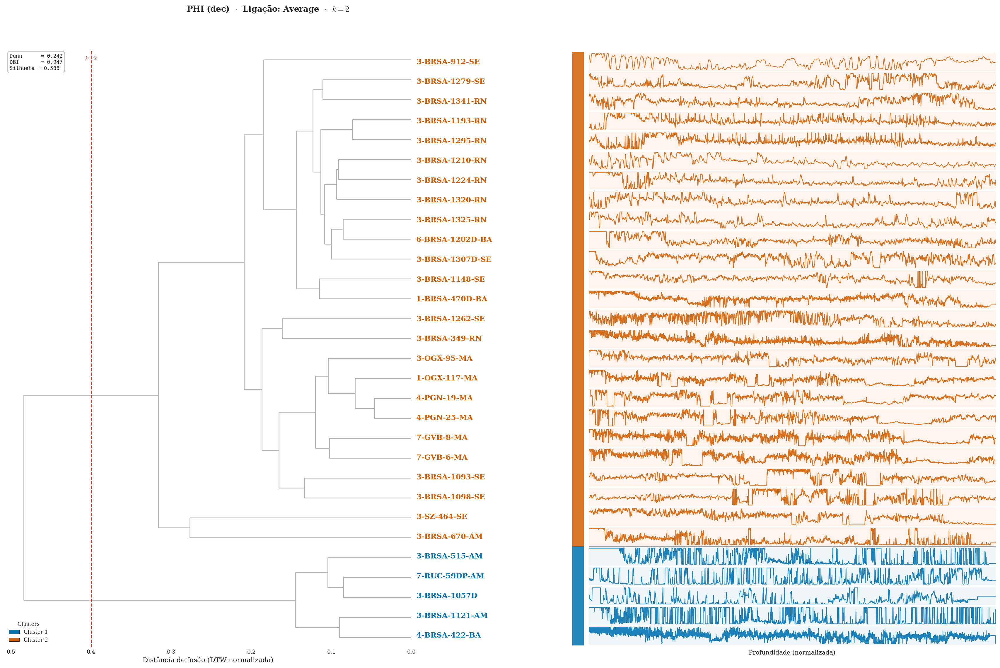

✓ Concluído: PHI (dec)  →  dendrogramas_dissertacao/dendrograma_PHI_dec_dissertacao.pdf


  Salvo: dendrogramas_dissertacao/dendrograma_DT_us_ft_dissertacao.pdf


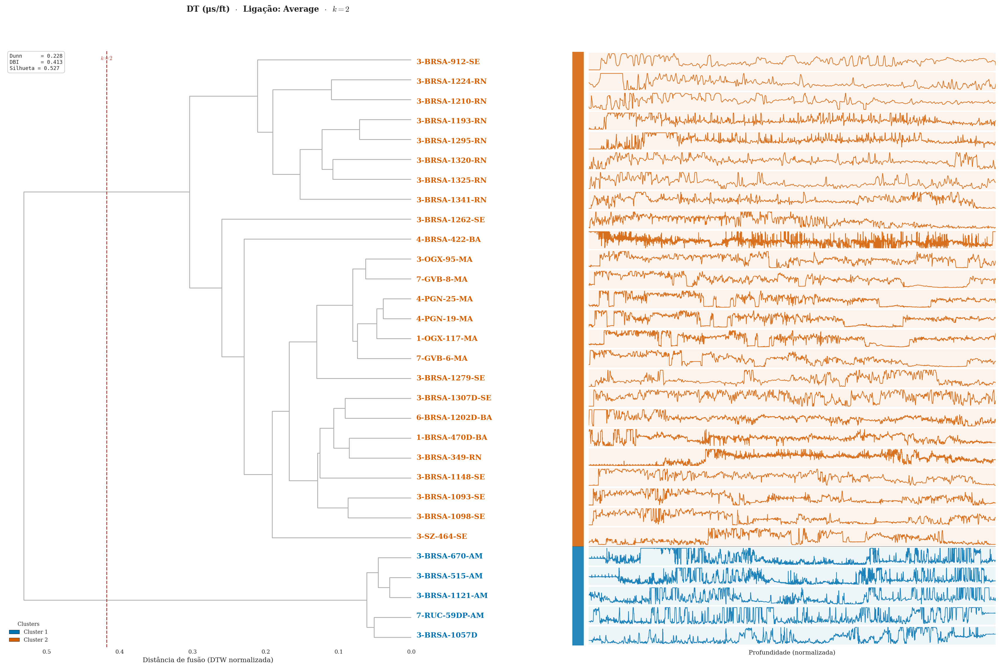

✓ Concluído: DT (μs/ft)  →  dendrogramas_dissertacao/dendrograma_DT_us_ft_dissertacao.pdf


  Salvo: dendrogramas_dissertacao/dendrograma_PE_b_e_dissertacao.pdf


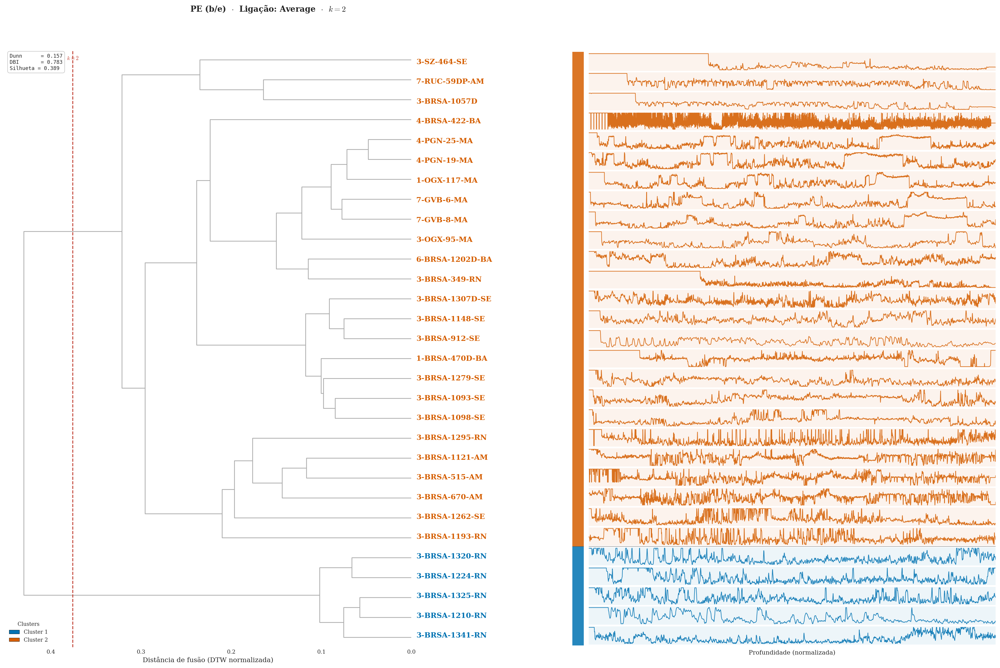

✓ Concluído: PE (b/e)  →  dendrogramas_dissertacao/dendrograma_PE_b_e_dissertacao.pdf


In [17]:
import matplotlib
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D
import matplotlib.gridspec as gridspec

# Tipografia dissertacao (Computer Modern / LaTeX-compatible)
_USE_TEX = False
try:
    import shutil
    _USE_TEX = shutil.which('latex') is not None
except Exception:
    pass

RC = {
    'text.usetex':               _USE_TEX,
    'font.family':               'serif',
    'font.serif':                ['Computer Modern Roman', 'CMU Serif',
                                  'DejaVu Serif', 'Times New Roman'],
    'mathtext.fontset':          'cm',
    'axes.formatter.use_mathtext': True,
    'font.size':                 11,
    'axes.labelsize':            12,
    'axes.titlesize':            13,
    'xtick.labelsize':           10,
    'ytick.labelsize':           10,
    'legend.fontsize':           10,
    'figure.titlesize':          14,
    'axes.linewidth':            0.8,
    'lines.linewidth':           1.2,
    'xtick.major.width':         0.8,
    'ytick.major.width':         0.8,
    'xtick.minor.width':         0.5,
    'ytick.minor.width':         0.5,
    'xtick.direction':           'out',
    'ytick.direction':           'out',
    'axes.spines.top':           False,
    'axes.spines.right':         False,
    'pdf.fonttype':              42,
    'ps.fonttype':               42,
    'svg.fonttype':              'none',
    'figure.dpi':                150,
    'savefig.dpi':               300,
    'savefig.bbox':              'tight',
    'savefig.transparent':       False,
}
matplotlib.rcParams.update(RC)

OKABE_ITO = [
    '#0072B2', '#D55E00', '#009E73', '#CC79A7',
    '#56B4E9', '#E69F00', '#6A0572', '#8B4513',
]
EXTENDED_PALETTE = OKABE_ITO + [
    '#1f77b4','#ff7f0e','#2ca02c','#d62728',
    '#9467bd','#8c564b','#e377c2','#7f7f7f','#bcbd22','#17becf',
]
print(f'Tipografia dissertacao configurada  (text.usetex={_USE_TEX})')
print('  serif/CM | pdf.fonttype=42 | dpi_save=300')

def altura_corte_para_k(Z: np.ndarray, k: int) -> float:
    """
    Calcula a altura de corte do dendrograma para obter exatamente k clusters.
    Retorna o ponto médio entre as duas últimas fusões relevantes.
    """
    d   = np.sort(np.asarray(Z[:, 2], float))
    n   = len(d) + 1
    if k <= 1:
        return float(d[-1] * 1.01)
    if k >= n:
        return float(max(d[0] * 0.99, 0.0))
    idx = n - k
    return float((d[idx - 1] + d[idx]) / 2.0)


print('✓ altura_corte_para_k definida.')
# Nota: sanitizar_matriz e slug já estão definidas na Seção 6.

def _build_link_color_func(Z, n_original_obs, cluster_map_idx, palette):
    node_to_cluster_label = {}
    for i in range(n_original_obs):
        node_to_cluster_label[i] = cluster_map_idx[i]

    for i in range(len(Z)):
        node_id = n_original_obs + i
        left_child = int(Z[i, 0])
        right_child = int(Z[i, 1])

        label1 = node_to_cluster_label.get(left_child)
        label2 = node_to_cluster_label.get(right_child)

        if label1 is not None and label1 == label2:
            node_to_cluster_label[node_id] = label1
        else:
            node_to_cluster_label[node_id] = None

    def link_color_func_impl(k):
        cluster_label = node_to_cluster_label.get(n_original_obs + k)
        if cluster_label is not None:
            return palette[(cluster_label - 1) % len(palette)]
        else:
            return '#aaaaaa'

    return link_color_func_impl

def plot_dendrograma_dissertacao(
    D, pocos, series_dict, var, method, k_final,
    dunn=None, dbi=None, silhouette=None,
    salvar_em=None, dpi=300,
    figsize=(24, 16),
    lw_series=0.9,
    leaf_fs=9.5,
):
    """
    Dendrograma hierárquico com mini-séries laterais
    e coluna própria para os nomes dos poços.

    Returns: Z_olo, labels_k, leaf_order
    """
    from scipy.cluster.hierarchy import optimal_leaf_ordering
    import matplotlib.gridspec as gridspec

    D = sanitizar_matriz(D)
    pocos = list(pocos)
    n = len(pocos)
    palette = EXTENDED_PALETTE

    # Linkage + ordenação ótima
    y = squareform(D, checks=False)
    Z_olo = linkage(y, method=method)
    Z_olo = optimal_leaf_ordering(Z_olo, y)
    labels_k = fcluster(Z_olo, t=k_final, criterion='maxclust')

    # Mapas de cluster
    cluster_map_idx = {i: int(labels_k[i]) for i in range(n)}
    cluster_map_name = {pocos[i]: int(labels_k[i]) for i in range(n)}

    link_color = _build_link_color_func(Z_olo, n, cluster_map_idx, palette)
    cut_h = altura_corte_para_k(Z_olo, k_final)

    # Figura com 4 colunas:
    # dendrograma | labels | stripe | séries
    fig_h = max(10, 0.40 * n + 4)
    fig = plt.figure(figsize=(figsize[0], fig_h), facecolor='white')
    gs = gridspec.GridSpec(
        1, 4, figure=fig,
        width_ratios=[4.3, 1.6, 0.12, 4.3],
        wspace=0.02, left=0.03, right=0.97,
        top=0.91, bottom=0.06,
    )

    ax_d   = fig.add_subplot(gs[0])  # dendrograma
    ax_lab = fig.add_subplot(gs[1])  # nomes dos poços
    ax_st  = fig.add_subplot(gs[2])  # faixa de cor
    ax_s   = fig.add_subplot(gs[3])  # séries

    # FUNDO BRANCO DOS EIXOS
    ax_d.set_facecolor('white')
    ax_lab.set_facecolor('white')
    ax_st.set_facecolor('white')
    ax_s.set_facecolor('white')

    # remove grade, se houver estilo global ativo
    ax_d.grid(False)
    ax_s.grid(False)

    # Dendrograma sem labels visíveis
    dend = dendrogram(
        Z_olo,
        ax=ax_d,
        orientation='left',
        labels=pocos,
        leaf_font_size=leaf_fs,
        link_color_func=link_color,
        above_threshold_color='#aaaaaa',
        color_threshold=cut_h,
        leaf_rotation=0,
    )

    leaf_indices = dend['leaves']
    leaf_order = [pocos[i] for i in leaf_indices]
    leaf_y_pos = {leaf_order[k]: 5 + 10 * k for k in range(n)}

    y_dendro_lo = -1
    y_dendro_hi = 10 * n + 1

    # Remove labels do eixo do dendrograma
    ax_d.set_yticklabels([])
    ax_d.tick_params(axis='y', length=0)

    # Linha de corte
    ax_d.axvline(cut_h, color='#c0392b', linestyle='--',
                 linewidth=1.4, zorder=10)

    y_top = ax_d.get_ylim()[1] if ax_d.get_ylim()[1] > 0 else 10 * n
    ax_d.text(
        cut_h, y_top * 0.99,
        f'$k = {k_final}$',
        color='#c0392b', fontsize=9, fontweight='bold',
        ha='center', va='top'
    )

    ax_d.set_xlabel('Distância de fusão (DTW normalizada)', fontsize=11)
    ax_d.tick_params(axis='x', labelsize=9)
    ax_d.spines['top'].set_visible(False)
    ax_d.spines['right'].set_visible(False)

    # Coluna própria para os nomes
    ax_lab.set_xlim(0, 1)
    ax_lab.set_ylim(y_dendro_lo, y_dendro_hi)
    ax_lab.axis('off')

    for poco in leaf_order:
        c = cluster_map_name.get(poco, 1)
        clr = palette[(c - 1) % len(palette)]
        yc = leaf_y_pos[poco]
        ax_lab.text(
            0.0, yc, poco,
            va='center', ha='left',
            fontsize=leaf_fs,
            color=clr,
            fontweight='semibold',
            clip_on=False
        )

      # Caixa de métricas — canto superior esquerdo da folha
    metric_lines = []
    if dunn is not None and np.isfinite(float(dunn)):
        metric_lines.append(f'Dunn      = {dunn:.3f}')
    if dbi is not None and np.isfinite(float(dbi)):
        metric_lines.append(f'DBI       = {dbi:.3f}')
    if silhouette is not None and np.isfinite(float(silhouette)):
        metric_lines.append(f'Silhueta = {silhouette:.3f}')

    if metric_lines:
        fig.text(
            0.035, 0.905, '\n'.join(metric_lines),
            va='top', ha='left',
            fontsize=8.5, family='monospace',
            bbox=dict(
                boxstyle='round,pad=0.4',
                facecolor='white',
                edgecolor='#bbbbbb',
                linewidth=0.7,
                alpha=1.0
            )
        )

    # Legenda
    legend_handles = [
        mpatches.Patch(
            facecolor=palette[c % len(palette)],
            edgecolor='black', linewidth=0.4,
            label=f'Cluster {c+1}'
        ) for c in range(k_final)
    ]
    ax_d.legend(
        handles=legend_handles,
        loc='lower left',
        fontsize=8.5,
        framealpha=1.0,
        facecolor='white',
        edgecolor='#cccccc',
        title='Clusters',
        title_fontsize=8.5
    )

    # Stripe
    ax_st.set_xlim(0, 1)
    ax_st.set_ylim(y_dendro_lo, y_dendro_hi)
    ax_st.axis('off')

    for poco in leaf_order:
        c = cluster_map_name.get(poco, 1)
        clr = palette[(c - 1) % len(palette)]
        yc = leaf_y_pos[poco]
        ax_st.add_patch(plt.Rectangle(
            (0, yc - 5), 1, 10,
            facecolor=clr, edgecolor='none', alpha=0.85
        ))

    # Painel de séries
    ax_s.set_xlim(0, 1)
    ax_s.set_ylim(y_dendro_lo, y_dendro_hi)
    ax_s.set_yticks([])
    ax_s.set_xticks([])
    ax_s.set_xlabel('Profundidade (normalizada)', fontsize=10)
    ax_s.spines['top'].set_visible(False)
    ax_s.spines['right'].set_visible(False)
    ax_s.spines['left'].set_visible(False)
    ax_s.spines['bottom'].set_linewidth(0.6)

    for poco in leaf_order:
        c = cluster_map_name.get(poco, 1)
        clr = palette[(c - 1) % len(palette)]
        yc = leaf_y_pos[poco]

        ax_s.axhspan(yc - 4.6, yc + 4.6,
                     facecolor=clr, alpha=0.07, zorder=1)

        s = series_dict.get(poco)
        if s is None:
            continue

        s_arr = np.asarray(s, float)
        s_fin = s_arr[np.isfinite(s_arr)]
        if len(s_fin) < 2:
            continue

        s_lo = float(np.nanpercentile(s_fin, 2))
        s_hi = float(np.nanpercentile(s_fin, 98))
        rng = (s_hi - s_lo) or 1.0
        s_norm = np.clip((s_fin - s_lo) / rng, 0.0, 1.0)
        s_y = yc - 4.1 + s_norm * 8.2
        xs = np.linspace(0, 1, len(s_y))

        ax_s.plot(
            xs, s_y, color=clr,
            linewidth=lw_series, alpha=0.88, zorder=3
        )

    # Separadores entre clusters
    for k in range(1, n):
        p_prev = leaf_order[k - 1]
        p_curr = leaf_order[k]
        if cluster_map_name.get(p_prev, 1) != cluster_map_name.get(p_curr, 1):
            sep_y = (leaf_y_pos[p_prev] + leaf_y_pos[p_curr]) / 2.0
            ax_s.axhline(sep_y, color='#444', linewidth=0.8,
                         linestyle='-', alpha=0.55, zorder=4)
            ax_st.axhline(sep_y, color='#444', linewidth=0.8,
                          linestyle='-', alpha=0.55, zorder=4)

    fig.suptitle(
        f'{var}  $\cdot$  Ligação: {method.capitalize()}  $\cdot$  $k = {k_final}$',
        fontsize=13, fontweight='bold', y=0.975, x=0.28
    )

    if salvar_em:
        dirpath = os.path.dirname(os.path.abspath(salvar_em))
        if dirpath:
            os.makedirs(dirpath, exist_ok=True)

        fig.savefig(
            salvar_em,
            dpi=dpi,
            bbox_inches='tight',
            pad_inches=0.20,
            facecolor='white'
        )
        fig.savefig(
            salvar_em.replace('.pdf', '.png'),
            dpi=dpi,
            bbox_inches='tight',
            pad_inches=0.20,
            facecolor='white'
        )
        print(f'  Salvo: {salvar_em}')

    plt.show()
    plt.close(fig)
    return Z_olo, labels_k, leaf_order

# rcParams ja configurados na Celula 43.
print('rcParams: ok (ver Celula 43)')

OUTDIR_DENDRO_SERIES = "dendrogramas_dissertacao"
os.makedirs(OUTDIR_DENDRO_SERIES, exist_ok=True)

for var_name, info_var in clusters_finais.items():

    D_var = info_var["matriz_dtw"]
    pocos_var = info_var["pocos"]

    series_por_poco_var = {
        well: preparar_univariado(df_dict_zglobal[well], var_name)
        for well in pocos_var
    }

    arquivo_saida = os.path.join(
        OUTDIR_DENDRO_SERIES,
        f"dendrograma_{slug(var_name)}_dissertacao.pdf"
    )

    Z, labels, ordem = plot_dendrograma_dissertacao(
        D=D_var,
        pocos=pocos_var,
        series_dict=series_por_poco_var,
        var=var_name,
        method=info_var["ligacao"],
        k_final=info_var["k_final"],
        dunn=info_var["dunn"],
        dbi=info_var["dbi"],
        silhouette=info_var["silhouette"],
        salvar_em=arquivo_saida,
        dpi=800, # Changed from 300 to 800
        figsize=(24, 16),
        lw_series=1.0,
        leaf_fs=12 # Changed from 9.5 to 12
    )

    print(f"✓ Concluído: {var_name}  →  {arquivo_saida}")

## 13. Painel de índices de validação

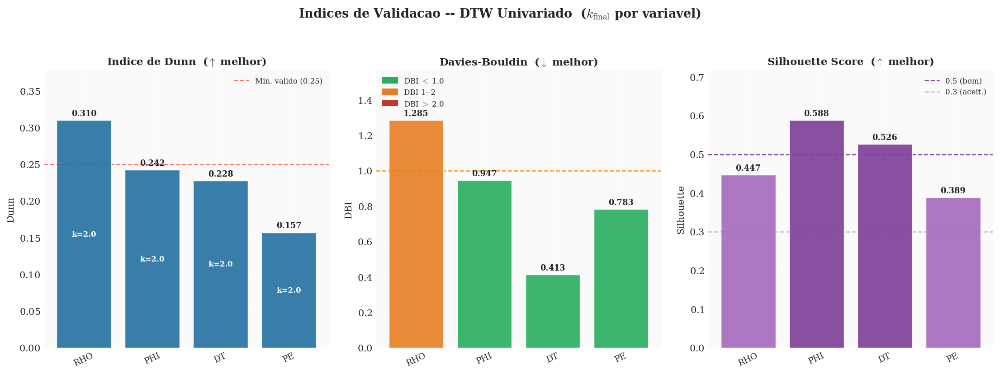

Painel univariado salvo em: plots_clustering/indices_validacao_consolidado.pdf


In [18]:

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

df_plot = df_resumo_final.copy().dropna(subset=['Dunn ↑', 'DBI ↓', 'Silhouette ↑'])

if df_plot.empty:
    print('df_resumo_final vazio -- rode as secoes anteriores primeiro.')
else:
    vars_  = df_plot['variavel'].tolist()
    vars_label = [v.split(' ')[0] for v in vars_]
    dunn_  = df_plot['Dunn ↑'].tolist()
    dbi_   = df_plot['DBI ↓'].tolist()
    sil_   = df_plot['Silhouette ↑'].tolist()
    k_lst  = df_k_final.set_index('variavel')['k_final'].to_dict()

    # ---- Figura 3 paineis lado a lado ----------------------------------------
    fig, axes = plt.subplots(1, 3, figsize=(15, 5.5))
    fig.patch.set_facecolor('white')

    BAR_ALPHA = 0.90
    EDGE_CLR  = 'white'
    LW_EDGE   = 0.7

    # ---------- Dunn ---------------------------------------------------------
    ax = axes[0]
    ax.set_facecolor('#fafafa')
    bars = ax.bar(vars_label, dunn_,
                  color='#2471a3', edgecolor=EDGE_CLR, linewidth=LW_EDGE,
                  alpha=BAR_ALPHA, zorder=3)
    ax.axhline(DUNN_MIN_VALIDO, color='#e74c3c', linestyle='--',
               linewidth=1.2, alpha=0.8, label=f'Min. valido ({DUNN_MIN_VALIDO})')
    for bar, v, var in zip(bars, dunn_, vars_):
        k = k_lst.get(var, '?')
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(dunn_)*0.012,
                f'{v:.3f}', ha='center', va='bottom',
                fontsize=8.5, fontweight='bold')
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height()/2,
                f'k={k}', ha='center', va='center',
                fontsize=8, color='white', fontweight='bold')
    ax.set_title('Indice de Dunn  ($\\uparrow$ melhor)', fontweight='bold', fontsize=11)
    ax.set_ylabel('Dunn', fontsize=10)
    ax.set_ylim(0, max(dunn_) * 1.22)
    ax.legend(fontsize=8, loc='upper right')
    ax.grid(axis='y', alpha=0.3, zorder=0)
    ax.tick_params(axis='x', labelsize=9, rotation=25)
    ax.spines[['top','right']].set_visible(False)

    # ---------- DBI -----------------------------------------------------------
    ax = axes[1]
    ax.set_facecolor('#fafafa')
    cores_dbi = ['#27ae60' if v < 1.0 else '#c0392b' if v > 2.0 else '#e67e22'
                 for v in dbi_]
    bars = ax.bar(vars_label, dbi_,
                  color=cores_dbi, edgecolor=EDGE_CLR, linewidth=LW_EDGE,
                  alpha=BAR_ALPHA, zorder=3)
    for bar, v in zip(bars, dbi_):
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(dbi_)*0.012,
                f'{v:.3f}', ha='center', va='bottom',
                fontsize=8.5, fontweight='bold')
    ax.axhline(1.0, color='#f39c12', linestyle='--', linewidth=1.2, label='Limiar 1.0')
    ax.axhline(2.0, color='#c0392b', linestyle='--', linewidth=1.2, label='Limiar 2.0')
    ax.set_title('Davies-Bouldin  ($\\downarrow$ melhor)', fontweight='bold', fontsize=11)
    ax.set_ylabel('DBI', fontsize=10)
    ax.set_ylim(0, max(dbi_) * 1.22)
    p1 = mpatches.Patch(color='#27ae60', label='DBI $<$ 1.0')
    p2 = mpatches.Patch(color='#e67e22', label='DBI 1--2')
    p3 = mpatches.Patch(color='#c0392b', label='DBI $>$ 2.0')
    ax.legend(handles=[p1,p2,p3], fontsize=8, loc='upper left')
    ax.grid(axis='y', alpha=0.3, zorder=0)
    ax.tick_params(axis='x', labelsize=9, rotation=25)
    ax.spines[['top','right']].set_visible(False)

    # ---------- Silhouette ----------------------------------------------------
    ax = axes[2]
    ax.set_facecolor('#fafafa')
    cores_sil = ['#7d3c98' if v >= 0.5 else '#a569bd' if v >= 0.3 else '#d2b4de'
                 for v in sil_]
    bars = ax.bar(vars_label, sil_,
                  color=cores_sil, edgecolor=EDGE_CLR, linewidth=LW_EDGE,
                  alpha=BAR_ALPHA, zorder=3)
    for bar, v in zip(bars, sil_):
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(sil_)*0.012,
                f'{v:.3f}', ha='center', va='bottom',
                fontsize=8.5, fontweight='bold')
    ax.axhline(0.5, color='#7d3c98', linestyle='--', linewidth=1.2, label='0.5 (bom)')
    ax.axhline(0.3, color='#d2b4de', linestyle='--', linewidth=1.2, label='0.3 (aceit.)')
    ax.set_title('Silhouette Score  ($\\uparrow$ melhor)', fontweight='bold', fontsize=11)
    ax.set_ylabel('Silhouette', fontsize=10)
    ax.set_ylim(0, max(sil_) * 1.22)
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3, zorder=0)
    ax.tick_params(axis='x', labelsize=9, rotation=25)
    ax.spines[['top','right']].set_visible(False)

    fig.suptitle('Indices de Validacao -- DTW Univariado  ($k_{\\mathrm{final}}$ por variavel)',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(pad=1.5)
    out_iv = os.path.join(OUTDIR_CLUSTER, 'indices_validacao_consolidado.pdf')
    fig.savefig(out_iv, bbox_inches='tight')
    fig.savefig(out_iv.replace('.pdf','.png'), dpi=300, bbox_inches='tight')
    plt.show()
    print('Painel univariado salvo em:', out_iv)

## 14. Tabela-resumo de clusters finais

A tabela abaixo consolida apenas as variáveis mantidas no resultado principal da dissertação. Variáveis sem solução válida sob `MIN_CLUSTER_SIZE = 4` devem permanecer na análise de sensibilidade, não nesta tabela principal.


In [19]:

resumo_clusters = []
for var, info in clusters_finais.items():
    tab = info['tabela'].copy()
    tab['variavel'] = var
    resumo_clusters.append(tab)

if resumo_clusters:
    df_clusters_long = pd.concat(resumo_clusters, ignore_index=True)
    display(df_clusters_long.sort_values(['variavel', 'cluster_final', 'poco']).reset_index(drop=True))

    caminho_csv = os.path.join(OUTDIR_CLUSTER, 'clusters_finais_principais_long.csv')
    df_clusters_long.to_csv(caminho_csv, index=False, encoding='utf-8-sig')
    print('✓ CSV principal salvo em:', caminho_csv)
else:
    print('Nenhum cluster final disponível.')

,poco,cluster_final,variavel
0,3-BRSA-1057D,0,DT (μs/ft)
1,3-BRSA-1121-AM,0,DT (μs/ft)
2,3-BRSA-515-AM,0,DT (μs/ft)
3,3-BRSA-670-AM,0,DT (μs/ft)
4,7-RUC-59DP-AM,0,DT (μs/ft)
...,...,...,...
115,4-PGN-19-MA,1,RHO (g/cm³)
116,4-PGN-25-MA,1,RHO (g/cm³)
117,6-BRSA-1202D-BA,1,RHO (g/cm³)
118,7-GVB-6-MA,1,RHO (g/cm³)


✓ CSV principal salvo em: plots_clustering/clusters_finais_principais_long.csv


## 15. Observações finais

- Este notebook contém o resultado principal: DTW exato + clustering hierárquico univariado.
- `k_final` foi selecionado por uma regra única, transparente e estrita (`MIN_CLUSTER_SIZE = 4` sem fallback para a análise principal).
- As figuras principais são os dendrogramas coloridos com séries reamostradas na ordem das folhas.
- A reamostragem é apenas visual e não altera a DTW calculada nas séries originais.
- DBSCAN, OPTICS, HDBSCAN e sensibilidade de banda devem permanecer em notebook complementar de robustez.

**Correções aplicadas nesta versão:**
- `DBSCAN` removido dos imports (análise de densidade em notebook separado).
- `sanitizar_matriz(D, nome='')`, `slug()` e `tabela_clusters()` definidos **uma única vez** na Seção 6.
- `davies_bouldin_medoid`, `dunn_index` e `silhouette_safe` — versão única e canônica na Seção 6.
- `sensibilidade_k` alinhada com `MIN_CLUSTER_SIZE = 4`.
- `K_VALUES_INTERPOCOS = range(2, 10)` aplicado à análise de sensibilidade univariada e multivariada.
- `dtw_warping_path` definida uma única vez na Seção 6.
- Imports reorganizados e comentários consolidados.


In [20]:
# ── DTW multivariado interpoços ─────────────────────────────────────────────
wells_multi  = list(df_dict_qc.keys())
series_multi = {
    w: preparar_multivariado_normalizado(df_dict_qc[w])
    for w in wells_multi
}
valid_multi = [w for w in wells_multi if series_multi[w] is not None]
m_multi     = len(valid_multi)

D_multi = np.full((m_multi, m_multi), np.nan)
np.fill_diagonal(D_multi, 0.0)

for i in range(m_multi):
    for j in range(i + 1, m_multi):
        s1 = series_multi[valid_multi[i]]
        s2 = series_multi[valid_multi[j]]
        d_norm, _ = dtw_distancia(s1, s2, norm='sumlen')
        D_multi[i, j] = D_multi[j, i] = d_norm

df_D_multi = pd.DataFrame(D_multi, index=valid_multi, columns=valid_multi)
df_D_multi_ord = reordenar_matriz_por_estado(df_D_multi, ordem_estados=ESTADO_ORDEM)

triu_m = df_D_multi_ord.to_numpy(float)[np.triu_indices_from(df_D_multi_ord.to_numpy(float), k=1)]
triu_m = triu_m[np.isfinite(triu_m)]

print(f'✓ DTW multivariado interpoços calculado.')
print(f'  Dataset: df_dict_qc (min-max físico) | Métrica: L2 | Janela SC: {int(BAND_FRAC*100)}% | Norm: (N+M)')
print(f'  Poços válidos: {m_multi}')
print(f'  Distâncias: min={triu_m.min():.4f} | max={triu_m.max():.4f} | média={triu_m.mean():.4f}')


✓ DTW multivariado interpoços calculado.
  Dataset: df_dict_qc (min-max físico) | Métrica: L2 | Janela SC: 10% | Norm: (N+M)
  Poços válidos: 30
  Distâncias: min=0.0341 | max=0.2183 | média=0.1201


### 16.1. Heatmap multivariado

In [21]:
OUTDIR_MULTI = 'plots_crosswell_heatmaps/multivariado'
os.makedirs(OUTDIR_MULTI, exist_ok=True)

salvar_heatmap_df(
    D_input     = df_D_multi_ord,
    title       = 'DTW entre poços — Multivariado (L2, min-max físico)',
    outdir      = OUTDIR_MULTI,
    filename    = 'crosswell_dtw_multivariado.png',
    cmap        = 'viridis_r',
    ordenar     = True,
    ordem_estados = ESTADO_ORDEM,
    dpi         = 300,
    salvar_pdf  = True,
)
print(f'✓ Heatmap multivariado salvo em {OUTDIR_MULTI}')


✓ Heatmap multivariado salvo em plots_crosswell_heatmaps/multivariado


### 16.2. Pares mais similares — Multivariado

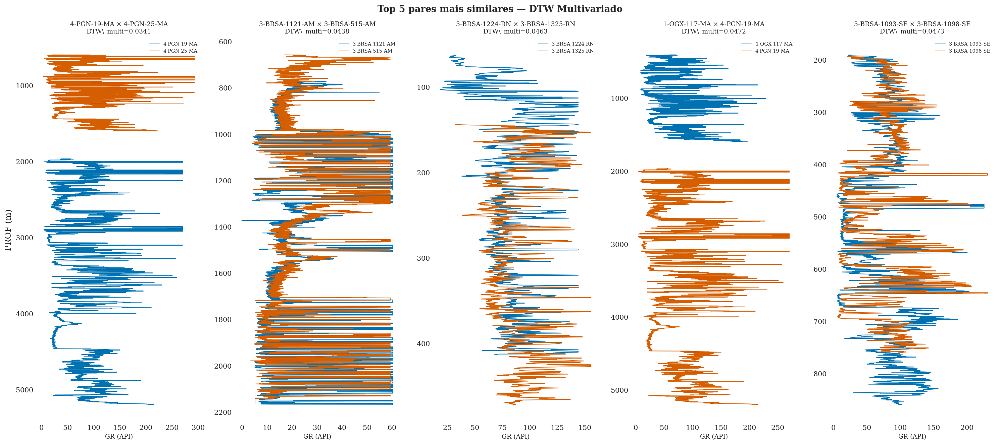


✓ Top 5 pares multivariado salvos em plots_series/multivariado_top5_pares
   4-PGN-19-MA × 4-PGN-25-MA  →  DTW_multi = 0.0341
   3-BRSA-1121-AM × 3-BRSA-515-AM  →  DTW_multi = 0.0438
   3-BRSA-1224-RN × 3-BRSA-1325-RN  →  DTW_multi = 0.0463
   1-OGX-117-MA × 4-PGN-19-MA  →  DTW_multi = 0.0472
   3-BRSA-1093-SE × 3-BRSA-1098-SE  →  DTW_multi = 0.0473


In [22]:

OUTDIR_MULTI_TOP5 = 'plots_series/multivariado_top5_pares'
os.makedirs(OUTDIR_MULTI_TOP5, exist_ok=True)

pairs_multi = topk_pairs_from_distance_df(df_D_multi, k=5)

fig, axes = plt.subplots(1, min(5, len(pairs_multi)),
                         figsize=(4 * min(5, len(pairs_multi)), 9),
                         sharey=False)
if len(pairs_multi) == 1:
    axes = [axes]
fig.patch.set_facecolor('white')

for idx, (dist, w1, w2) in enumerate(pairs_multi):
    ax = axes[idx]
    if w1 not in df_dict_qc or w2 not in df_dict_qc:
        ax.axis('off')
        continue
    for wi, col in [(w1, OKABE_ITO[0]), (w2, OKABE_ITO[1])]:
        df_wi = df_dict_qc[wi]
        depth_i = pd.to_numeric(df_wi[DEPTH_COL], errors='coerce')
        # Plota a 1ª variável disponível (GR) como proxy visual
        v = VARS_PETROFISICAS[0]
        if v in df_wi.columns:
            s = pd.to_numeric(df_wi[v], errors='coerce')
            mask = depth_i.notna() & s.notna()
            ax.plot(s[mask].values, depth_i[mask].values,
                    label=wi, color=col, linewidth=1.0)
    ax.invert_yaxis()
    ax.set_xlabel(VARS_PETROFISICAS[0], fontsize=9)
    ax.set_ylabel(DEPTH_COL if idx == 0 else '')
    ax.set_title(f'{w1} × {w2}\nDTW\_multi={dist:.4f}', fontsize=9)
    ax.legend(fontsize=7)
    ax.grid(True, alpha=0.25)
    ax.set_facecolor('white')

fig.suptitle('Top 5 pares mais similares — DTW Multivariado', fontsize=13, fontweight='bold')
plt.tight_layout()
fpath = os.path.join(OUTDIR_MULTI_TOP5, 'top5_pares_multi.png')
fig.savefig(fpath, dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print(f'\n✓ Top 5 pares multivariado salvos em {OUTDIR_MULTI_TOP5}')
for dist, w1, w2 in pairs_multi:
    print(f'   {w1} × {w2}  →  DTW_multi = {dist:.4f}')

## 17. Clustering Hierárquico Multivariado

Mesma pipeline do univariado: seleção de ligação por coeficiente cofenético (Ward excluído pela mesma razão: DTW não satisfaz a desigualdade de paralelogramo).

In [23]:
# ── Clustering hierárquico — multivariado ────────────────────────────────────
D_multi_san = sanitizar_matriz(df_D_multi_ord.to_numpy(float))
pocos_multi_ord = df_D_multi_ord.index.tolist()

df_lig_multi = escolher_ligacao(D_multi_san)
method_multi = df_lig_multi.loc[0, 'ligacao']
coph_multi   = float(df_lig_multi.loc[0, 'coef_cophenetico'])
Z_multi      = linkage(squareform(D_multi_san, checks=False), method=method_multi)

print('=== Seleção de ligação — DTW Multivariado ===')
display(df_lig_multi)
print(f'\nLigação selecionada : {method_multi}')
print(f'Cofenético          : {coph_multi:.4f}')


=== Seleção de ligação — DTW Multivariado ===


,ligacao,coef_cophenetico
0,weighted,0.7947
1,complete,0.7661
2,average,0.7472
3,single,0.6985



Ligação selecionada : weighted
Cofenético          : 0.7947


### 17.1. Seleção de `k_final` — Multivariado

In [24]:
resultados_hier_multi = {
    'Multivariado': {
        'matriz_dtw': D_multi_san,
        'pocos':      pocos_multi_ord,
        'hier': {
            'method': method_multi,
            'coph':   coph_multi,
            'Z':      Z_multi,
            'df_ligacoes': df_lig_multi,
        },
        'tempo_s': 0.0,
    }
}

df_sens_multi, df_best_k_multi = sensibilidade_k(
    resultados_hier_multi,
    k_values=K_VALUES_INTERPOCOS,
    min_cluster_size=MIN_CLUSTER_SIZE,
)

print('=== Sensibilidade a k — Multivariado ===')
display(df_sens_multi[['variavel','k','dunn','dbi','silhouette','menor_cluster','valido']]
        .sort_values(['variavel','k']))
print()
print('=== k sugerido ===')
display(df_best_k_multi)

df_k_final_multi = selecionar_k_final(
    df_sens_multi,
    p_dunn=0.95,
    min_cluster_size=MIN_CLUSTER_SIZE,
    dunn_min_valido=DUNN_MIN_VALIDO,
    dunn_ganho_min=DUNN_GANHO_MIN,
)

print('=== k_final selecionado — Multivariado ===')
display(df_k_final_multi)

clusters_finais_multi, df_resumo_final_multi = materializar_resultado_final(
    resultados_hier_multi, df_k_final_multi
)

print('=== Tabela final consolidada — Multivariado ===')
display(df_resumo_final_multi)

print('\n=== Composição dos clusters — Multivariado ===')
for var, info in clusters_finais_multi.items():
    print(f'\n{"="*70}')
    print(f'  {var}  |  ligação={info["ligacao"]}  |  k_final={info["k_final"]}')
    display(info['tabela'])


=== Sensibilidade a k — Multivariado ===


,variavel,k,dunn,dbi,silhouette,menor_cluster,valido
0,Multivariado,2,0.632031,1.369248,0.308367,6,True
1,Multivariado,3,0.632031,1.059941,0.273335,1,False
2,Multivariado,4,0.538680,1.028490,0.200597,1,False
3,Multivariado,5,0.538680,1.005545,0.139891,1,False
4,Multivariado,6,0.535618,1.142498,0.178254,1,False
5,Multivariado,7,0.602281,1.049879,0.261463,1,False
6,Multivariado,8,0.602281,0.986949,0.251712,1,False
7,Multivariado,9,0.668906,1.133455,0.260526,1,False



=== k sugerido ===


,variavel,ligacao,k,dunn,dbi,silhouette,menor_cluster,valido,tamanhos
0,Multivariado,weighted,2,0.632,1.3692,0.3084,6,True,"{np.int64(0): np.int64(24), np.int64(1): np.in..."



=== Seleção de k_final ===
  MIN_CLUSTER_SIZE = 4 | DUNN_MIN_VALIDO = 0.25 | DUNN_GANHO_MIN = 0.1

=== k_final selecionado — Multivariado ===


,variavel,ligacao,k_final,dunn_k_final,dbi_k_final,silhouette_k_final,menor_cluster_k_final,regra_k,origem_selecao,alerta_dunn
0,Multivariado,weighted,2,0.632,1.3692,0.3084,6,platô_dunn_95% + ganho>10% → DBI ↓ → Sil ↑ → k ↓,valido,False


=== Tabela final consolidada — Multivariado ===


,variavel,ligacao,k_final,Dunn ↑,DBI ↓,Silhouette ↑
0,Multivariado,weighted,2,0.632,1.3692,0.3084



=== Composição dos clusters — Multivariado ===

  Multivariado  |  ligação=weighted  |  k_final=2


,poco,cluster_final
0,1-BRSA-470D-BA,0
1,1-OGX-117-MA,0
2,3-BRSA-1093-SE,0
3,3-BRSA-1098-SE,0
4,3-BRSA-1148-SE,0
5,3-BRSA-1193-RN,0
6,3-BRSA-1210-RN,0
7,3-BRSA-1224-RN,0
8,3-BRSA-1262-SE,0
9,3-BRSA-1279-SE,0


## 18. Dendrogramas Multivariados com Séries

Os dendrogramas abaixo seguem a mesma lógica dos univariados (Seção 12), mas cada mini-série lateral exibe todas as variáveis petrofísicas empilhadas (Z-score global, para comparação visual).

  Salvo: dendrogramas_dissertacao/dendrograma_multivariado_Multivariado_dissertacao.pdf


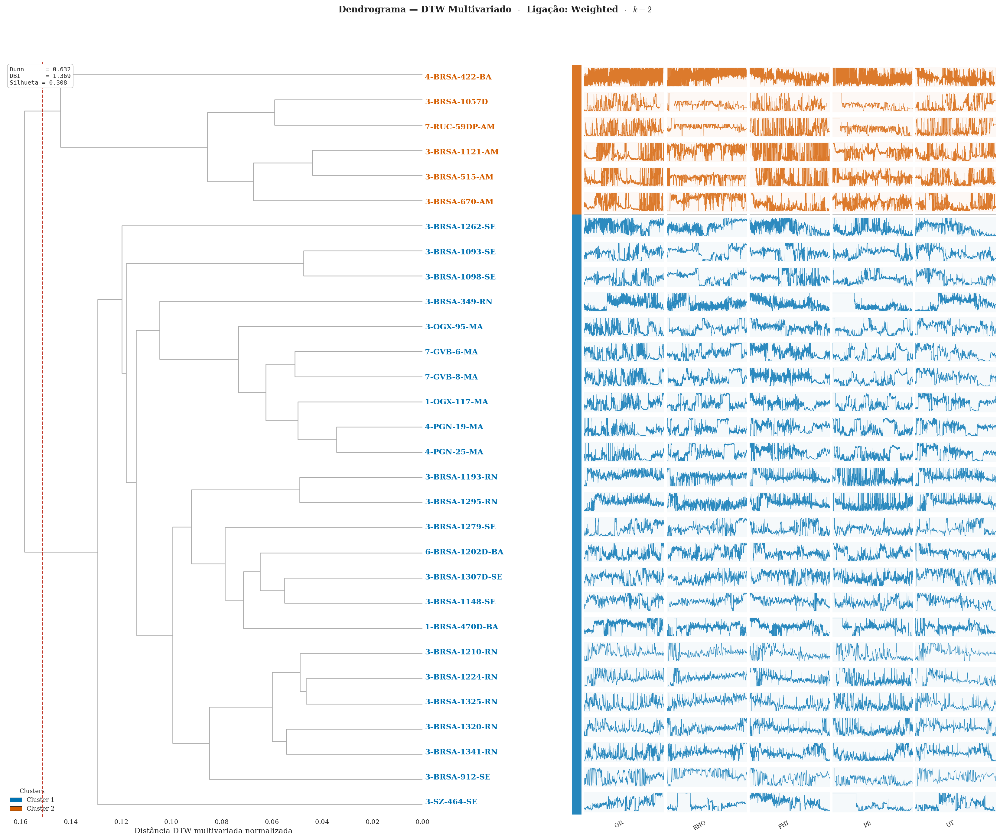

✓ Dendrograma multivariado → dendrogramas_dissertacao/dendrograma_multivariado_Multivariado_dissertacao.pdf


In [25]:

def plot_dendrograma_multivariado(
    D, pocos, df_dict_plot, method, k_final,
    dunn=None, dbi=None, silhouette=None,
    salvar_em=None, dpi=300,
    figsize_per_poco=0.52,
    leaf_fs=10.0,
    lw_series=0.45,
):
    """
    Dendrograma multivariado com:
    [dendrograma] [labels] [stripe] [mini-séries por variável]
    usando o mesmo sistema de coordenadas Y do dendrograma.
    """
    from scipy.cluster.hierarchy import optimal_leaf_ordering
    import matplotlib.gridspec as gridspec

    D = sanitizar_matriz(D)
    pocos = list(pocos)
    n = len(pocos)
    n_var = len(VARS_PETROFISICAS)
    palette = EXTENDED_PALETTE

    # Linkage
    y = squareform(D, checks=False)
    Z_olo = linkage(y, method=method)
    Z_olo = optimal_leaf_ordering(Z_olo, y)
    labels_k = fcluster(Z_olo, t=k_final, criterion='maxclust')

    cluster_map_idx = {i: int(labels_k[i]) for i in range(n)}
    cluster_map_name = {pocos[i]: int(labels_k[i]) for i in range(n)}
    link_color = _build_link_color_func(Z_olo, n, cluster_map_idx, palette)
    cut_h = altura_corte_para_k(Z_olo, k_final)

    # Layout com coluna extra para labels
    fig_h = max(10, figsize_per_poco * n + 4)
    fig_w = 12 + 2.2 * n_var
    fig = plt.figure(figsize=(fig_w, fig_h), facecolor='white')

    widths = [5.2, 1.8, 0.12] + [1.0] * n_var
    gs = gridspec.GridSpec(
        1, 3 + n_var, figure=fig,
        width_ratios=widths,
        wspace=0.02, left=0.03, right=0.98,
        top=0.91, bottom=0.06,
    )

    ax_d   = fig.add_subplot(gs[0])  # dendrograma
    ax_lab = fig.add_subplot(gs[1])  # labels dos poços
    ax_st  = fig.add_subplot(gs[2])  # faixa de cor

    # Fundo branco dos eixos
    ax_d.set_facecolor('white')
    ax_lab.set_facecolor('white')
    ax_st.set_facecolor('white')
    ax_d.grid(False)

    # Dendrograma
    dend = dendrogram(
        Z_olo,
        ax=ax_d,
        orientation='left',
        labels=pocos,
        leaf_font_size=leaf_fs,
        link_color_func=link_color,
        above_threshold_color='#aaaaaa',
        color_threshold=cut_h,
        leaf_rotation=0,
    )

    leaf_indices = dend['leaves']
    leaf_order = [pocos[i] for i in leaf_indices]
    leaf_y_pos = {leaf_order[k]: 5 + 10 * k for k in range(n)}
    y_lo, y_hi = -1, 10 * n + 1

    # Remove labels do dendrograma
    ax_d.set_yticklabels([])
    ax_d.tick_params(axis='y', length=0)

    # Linha de corte
    ax_d.axvline(cut_h, color='#c0392b', linestyle='--',
                 linewidth=1.4, zorder=10)
    y_top = ax_d.get_ylim()[1] if ax_d.get_ylim()[1] > 0 else 10 * n
    ax_d.text(
        cut_h, y_top * 0.99, f'$k={k_final}$',
        color='#c0392b', fontsize=9, fontweight='bold',
        ha='center', va='top'
    )

    ax_d.set_xlabel('Distância DTW multivariada normalizada', fontsize=12)
    ax_d.spines[['top', 'right']].set_visible(False)
    ax_d.tick_params(axis='x', labelsize=10)

    # Coluna dos nomes
    ax_lab.set_xlim(0, 1)
    ax_lab.set_ylim(y_lo, y_hi)
    ax_lab.axis('off')

    for poco in leaf_order:
        c = cluster_map_name.get(poco, 1)
        clr = palette[(c - 1) % len(palette)]
        yc = leaf_y_pos[poco]
        ax_lab.text(
            0.0, yc, poco,
            va='center', ha='left',
            fontsize=leaf_fs,
            color=clr,
            fontweight='semibold',
            clip_on=False
        )

    # Métricas — canto superior esquerdo da figura
    metric_lines = []
    if dunn is not None and np.isfinite(float(dunn)):
        metric_lines.append(f'Dunn      = {dunn:.3f}')
    if dbi is not None and np.isfinite(float(dbi)):
        metric_lines.append(f'DBI       = {dbi:.3f}')
    if silhouette is not None and np.isfinite(float(silhouette)):
        metric_lines.append(f'Silhueta = {silhouette:.3f}')

    if metric_lines:
        fig.text(
            0.035, 0.905, '\n'.join(metric_lines),
            va='top', ha='left',
            fontsize=9.5, family='monospace',
            bbox=dict(
                boxstyle='round,pad=0.4',
                facecolor='white',
                edgecolor='#bbbbbb',
                linewidth=0.7,
                alpha=1.0
            )
        )

    # Legenda
    legend_handles = [
        mpatches.Patch(
            facecolor=palette[c % len(palette)],
            edgecolor='black', linewidth=0.4,
            label=f'Cluster {c+1}'
        )
        for c in range(k_final)
    ]
    ax_d.legend(
        handles=legend_handles,
        loc='lower left',
        fontsize=9.5,
        framealpha=1.0,
        facecolor='white',
        edgecolor='#cccccc',
        title='Clusters',
        title_fontsize=9.5
    )

    # Faixa de cor
    ax_st.set_xlim(0, 1)
    ax_st.set_ylim(y_lo, y_hi)
    ax_st.axis('off')

    for poco in leaf_order:
        c = cluster_map_name.get(poco, 1)
        clr = palette[(c - 1) % len(palette)]
        yc = leaf_y_pos[poco]
        ax_st.add_patch(plt.Rectangle(
            (0, yc - 5), 1, 10,
            facecolor=clr, edgecolor='none', alpha=0.85
        ))

    # Painéis de séries por variável
    for vi, var in enumerate(VARS_PETROFISICAS):
        ax_s = fig.add_subplot(gs[vi + 3])
        ax_s.set_facecolor('white')
        ax_s.grid(False)
        ax_s.set_xlim(0, 1)
        ax_s.set_ylim(y_lo, y_hi)
        ax_s.set_yticks([])
        ax_s.set_xticks([])
        ax_s.set_xlabel(var.split(' ')[0], fontsize=9, rotation=30, ha='right')
        ax_s.spines[:].set_visible(False)

        for poco in leaf_order:
            c = cluster_map_name.get(poco, 1)
            clr = palette[(c - 1) % len(palette)]
            yc = leaf_y_pos[poco]

            ax_s.axhspan(yc - 4.1, yc + 4.1,
                         facecolor=clr, alpha=0.04, zorder=1)

            if poco not in df_dict_plot:
                continue

            s = preparar_univariado(df_dict_plot[poco], var)
            if s is None or len(s) < 2:
                continue

            s = np.asarray(s, float)
            s = s[np.isfinite(s)]
            if len(s) < 2:
                continue

            s_lo = float(np.nanpercentile(s, 2))
            s_hi = float(np.nanpercentile(s, 98))
            rng = (s_hi - s_lo) or 1.0
            s_n = np.clip((s - s_lo) / rng, 0.0, 1.0)
            s_y = yc - 3.6 + s_n * 7.2
            xs = np.linspace(0, 1, len(s_y))

            ax_s.plot(
                xs, s_y,
                color=clr,
                linewidth=lw_series,
                alpha=0.82,
                zorder=3
            )

        for k in range(1, n):
            p0 = leaf_order[k - 1]
            p1 = leaf_order[k]
            if cluster_map_name.get(p0, 1) != cluster_map_name.get(p1, 1):
                sep = (leaf_y_pos[p0] + leaf_y_pos[p1]) / 2.0
                ax_s.axhline(
                    sep,
                    color='#444',
                    linewidth=0.7,
                    linestyle='-',
                    alpha=0.5,
                    zorder=4
                )

    fig.suptitle(
        f'Dendrograma — DTW Multivariado  $\cdot$  '
        f'Ligação: {method.capitalize()}  $\cdot$  $k = {k_final}$',
        fontsize=14,
        fontweight='bold',
        y=0.975,
        x=0.50,
    )

    if salvar_em:
        dirpath = os.path.dirname(os.path.abspath(salvar_em))
        if dirpath:
            os.makedirs(dirpath, exist_ok=True)

        fig.savefig(
            salvar_em,
            dpi=dpi,
            bbox_inches='tight',
            pad_inches=0.20,
            facecolor='white'
        )
        fig.savefig(
            salvar_em.replace('.pdf', '.png'),
            dpi=dpi,
            bbox_inches='tight',
            pad_inches=0.20,
            facecolor='white'
        )
        print(f'  Salvo: {salvar_em}')

    plt.show()
    plt.close(fig)
    return Z_olo, labels_k, leaf_order

OUTDIR_DENDRO_MULTI = 'dendrogramas_dissertacao'
os.makedirs(OUTDIR_DENDRO_MULTI, exist_ok=True)

for chave_modelo, info_var in clusters_finais_multi.items():
    arquivo_saida = os.path.join(
        OUTDIR_DENDRO_MULTI,
        f'dendrograma_multivariado_{slug(chave_modelo)}_dissertacao.pdf'
    )

    Z_m, labels_m, ordem_m = plot_dendrograma_multivariado(
        D=info_var['matriz_dtw'],
        pocos=info_var['pocos'],
        df_dict_plot=df_dict_qc,
        method=info_var['ligacao'],
        k_final=info_var['k_final'],
        dunn=info_var['dunn'],
        dbi=info_var['dbi'],
        silhouette=info_var['silhouette'],
        salvar_em=arquivo_saida,
        dpi=800, # Changed from 300 to 800
        leaf_fs=12 # Changed from 10.0 to 12
    )

    print(f'✓ Dendrograma multivariado → {arquivo_saida}')

## 19. Painel de Índices de Validação — Multivariado

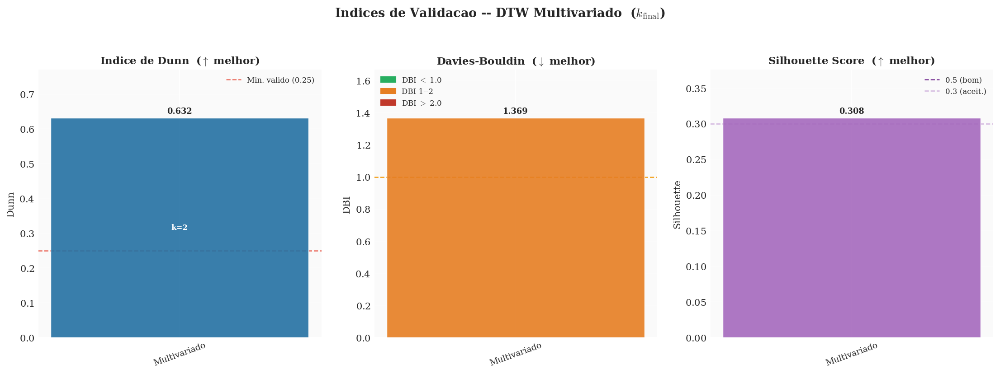

Painel multivariado salvo em: plots_clustering/indices_validacao_multivariado.pdf


In [26]:

df_plot_m = df_resumo_final_multi.copy().dropna(
    subset=['Dunn ↑', 'DBI ↓', 'Silhouette ↑'])

if df_plot_m.empty:
    print('df_resumo_final_multi vazio.')
else:
    vars_m     = df_plot_m['variavel'].tolist()
    vars_m_lbl = [v.split(' ')[0] for v in vars_m]
    dunn_m  = df_plot_m['Dunn ↑'].tolist()
    dbi_m   = df_plot_m['DBI ↓'].tolist()
    sil_m   = df_plot_m['Silhouette ↑'].tolist()
    k_m     = df_k_final_multi.set_index('variavel')['k_final'].to_dict()

    BAR_ALPHA = 0.90
    EDGE_CLR  = 'white'
    LW_EDGE   = 0.7

    fig, axes = plt.subplots(1, 3, figsize=(15, 5.5))
    fig.patch.set_facecolor('white')

    # Dunn
    ax = axes[0]; ax.set_facecolor('#fafafa')
    bars = ax.bar(vars_m_lbl, dunn_m, color='#2471a3',
                  edgecolor=EDGE_CLR, linewidth=LW_EDGE, alpha=BAR_ALPHA, zorder=3)
    ax.axhline(DUNN_MIN_VALIDO, color='#e74c3c', linestyle='--',
               linewidth=1.2, alpha=0.8, label=f'Min. valido ({DUNN_MIN_VALIDO})')
    for bar, v, var in zip(bars, dunn_m, vars_m):
        k = k_m.get(var,'?')
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+max(dunn_m)*0.012,
                f'{v:.3f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()/2,
                f'k={k}', ha='center', va='center', fontsize=8, color='white', fontweight='bold')
    ax.set_title('Indice de Dunn  ($\\uparrow$ melhor)', fontweight='bold', fontsize=11)
    ax.set_ylabel('Dunn', fontsize=10)
    ax.set_ylim(0, max(dunn_m)*1.22 if dunn_m else 1)
    ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3, zorder=0)
    ax.tick_params(axis='x', labelsize=9, rotation=20)
    ax.spines[['top','right']].set_visible(False)

    # DBI
    ax = axes[1]; ax.set_facecolor('#fafafa')
    cores_dbi = ['#27ae60' if v<1.0 else '#c0392b' if v>2.0 else '#e67e22' for v in dbi_m]
    bars = ax.bar(vars_m_lbl, dbi_m, color=cores_dbi,
                  edgecolor=EDGE_CLR, linewidth=LW_EDGE, alpha=BAR_ALPHA, zorder=3)
    for bar, v in zip(bars, dbi_m):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+max(dbi_m)*0.012,
                f'{v:.3f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
    ax.axhline(1.0, color='#f39c12', linestyle='--', linewidth=1.2, label='Limiar 1.0')
    ax.axhline(2.0, color='#c0392b', linestyle='--', linewidth=1.2, label='Limiar 2.0')
    ax.set_title('Davies-Bouldin  ($\\downarrow$ melhor)', fontweight='bold', fontsize=11)
    ax.set_ylabel('DBI', fontsize=10)
    ax.set_ylim(0, max(dbi_m)*1.22 if dbi_m else 1)
    p1 = mpatches.Patch(color='#27ae60', label='DBI $<$ 1.0')
    p2 = mpatches.Patch(color='#e67e22', label='DBI 1--2')
    p3 = mpatches.Patch(color='#c0392b', label='DBI $>$ 2.0')
    ax.legend(handles=[p1,p2,p3], fontsize=8, loc='upper left')
    ax.grid(axis='y', alpha=0.3, zorder=0)
    ax.tick_params(axis='x', labelsize=9, rotation=20)
    ax.spines[['top','right']].set_visible(False)

    # Silhouette
    ax = axes[2]; ax.set_facecolor('#fafafa')
    cores_sil = ['#7d3c98' if v>=0.5 else '#a569bd' if v>=0.3 else '#d2b4de' for v in sil_m]
    bars = ax.bar(vars_m_lbl, sil_m, color=cores_sil,
                  edgecolor=EDGE_CLR, linewidth=LW_EDGE, alpha=BAR_ALPHA, zorder=3)
    for bar, v in zip(bars, sil_m):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+max(sil_m)*0.012,
                f'{v:.3f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
    ax.axhline(0.5, color='#7d3c98', linestyle='--', linewidth=1.2, label='0.5 (bom)')
    ax.axhline(0.3, color='#d2b4de', linestyle='--', linewidth=1.2, label='0.3 (aceit.)')
    ax.set_title('Silhouette Score  ($\\uparrow$ melhor)', fontweight='bold', fontsize=11)
    ax.set_ylabel('Silhouette', fontsize=10)
    ax.set_ylim(0, max(sil_m)*1.22 if sil_m else 1)
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3, zorder=0)
    ax.tick_params(axis='x', labelsize=9, rotation=20)
    ax.spines[['top','right']].set_visible(False)

    fig.suptitle('Indices de Validacao -- DTW Multivariado  ($k_{\\mathrm{final}}$)',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout(pad=1.5)
    out_valid = os.path.join(OUTDIR_CLUSTER, 'indices_validacao_multivariado.pdf')
    fig.savefig(out_valid, bbox_inches='tight')
    fig.savefig(out_valid.replace('.pdf','.png'), dpi=300, bbox_inches='tight')
    plt.show()
    print('Painel multivariado salvo em:', out_valid)

## 20. Tabela-resumo de Clusters Multivariados

Consolida os clusters finais do DTW multivariado. Esta tabela serve como apêndice da dissertação.

In [27]:

resumo_clusters_multi = []
for var, info in clusters_finais_multi.items():
    tab = info['tabela'].copy()
    tab['variavel'] = var
    resumo_clusters_multi.append(tab)

if resumo_clusters_multi:
    df_clusters_long_multi = pd.concat(resumo_clusters_multi, ignore_index=True)
    display(df_clusters_long_multi.sort_values(['variavel','cluster_final','poco'])
            .reset_index(drop=True))

    caminho_csv_m = os.path.join(OUTDIR_CLUSTER, 'clusters_finais_multivariado_long.csv')
    df_clusters_long_multi.to_csv(caminho_csv_m, index=False, encoding='utf-8-sig')
    print('✓ CSV salvo em:', caminho_csv_m)
else:
    print('Nenhum cluster multivariado disponível.')

,poco,cluster_final,variavel
0,1-BRSA-470D-BA,0,Multivariado
1,1-OGX-117-MA,0,Multivariado
2,3-BRSA-1093-SE,0,Multivariado
3,3-BRSA-1098-SE,0,Multivariado
4,3-BRSA-1148-SE,0,Multivariado
5,3-BRSA-1193-RN,0,Multivariado
6,3-BRSA-1210-RN,0,Multivariado
7,3-BRSA-1224-RN,0,Multivariado
8,3-BRSA-1262-SE,0,Multivariado
9,3-BRSA-1279-SE,0,Multivariado


✓ CSV salvo em: plots_clustering/clusters_finais_multivariado_long.csv


## 21. Comparação Univariado vs. Multivariado

Tabela e gráfico comparando os índices de validação das duas abordagens.

=== Comparacao: Univariado vs. Multivariado ===


,variavel,abordagem,k_final,dunn,dbi,sil,ligacao
0,RHO (g/cm³),Univariado,2,0.3099,1.2848,0.4469,average
1,PHI (dec),Univariado,2,0.2422,0.9466,0.5879,average
2,DT (μs/ft),Univariado,2,0.2277,0.4131,0.5265,average
3,PE (b/e),Univariado,2,0.1572,0.7827,0.3890,average
4,Multivariado,Multivariado,2,0.6320,1.3692,0.3084,weighted


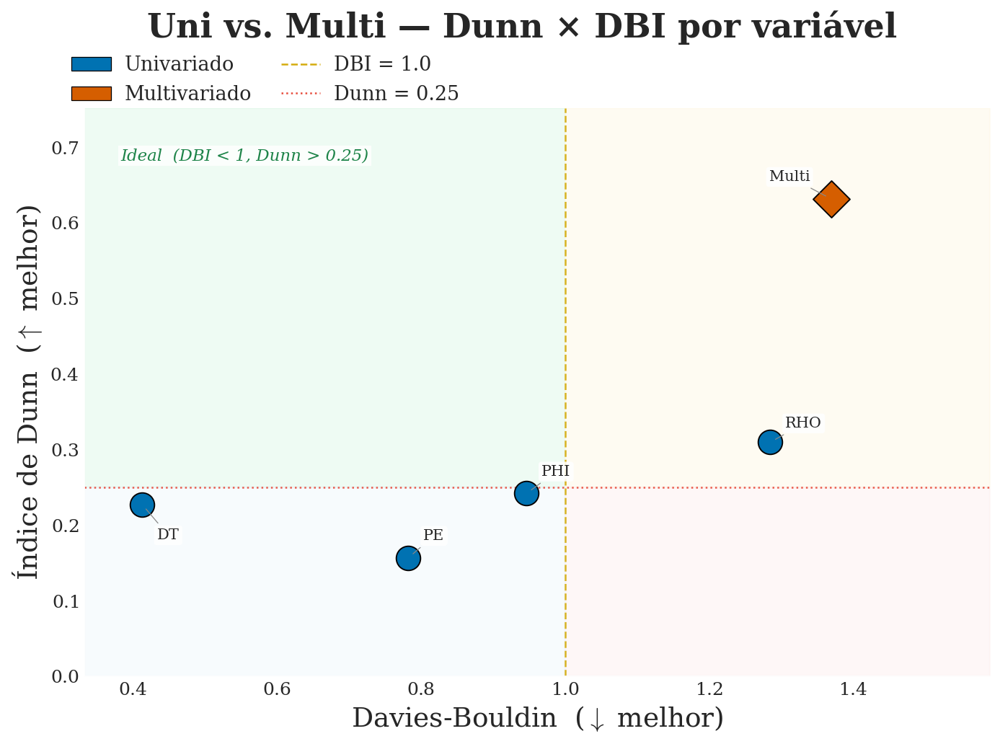

Figura comparacao salva em: plots_clustering/comparacao_uni_vs_multi_dissertacao.pdf


In [28]:

from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import os

# Consolida métricas de ambas as abordagens
df_uni_m = df_resumo_final.rename(columns={
    'Dunn ↑': 'dunn', 'DBI ↓': 'dbi', 'Silhouette ↑': 'sil'
}).copy()
df_uni_m['abordagem'] = 'Univariado'
df_uni_m['rotulo'] = df_uni_m['variavel'].str.split(' ').str[0]

df_mul_m = df_resumo_final_multi.rename(columns={
    'Dunn ↑': 'dunn', 'DBI ↓': 'dbi', 'Silhouette ↑': 'sil'
}).copy()
df_mul_m['abordagem'] = 'Multivariado'
df_mul_m['rotulo'] = 'Multi'

df_comp = (
    pd.concat([df_uni_m, df_mul_m], ignore_index=True)
      .dropna(subset=['dunn', 'dbi'])
)

print('=== Comparacao: Univariado vs. Multivariado ===')
display(df_comp[['variavel', 'abordagem', 'k_final', 'dunn', 'dbi', 'sil', 'ligacao']])

# Estilo dos pontos
estilo = {
    'Univariado':   dict(marker='o', s=260, color=OKABE_ITO[0], zorder=5),
    'Multivariado': dict(marker='D', s=300, color=OKABE_ITO[1], zorder=6),
}

# Figura
fig, ax = plt.subplots(figsize=(10.8, 7.2))
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

# Reservar espaço superior para título + legenda
fig.subplots_adjust(top=0.84)

# Limites
dbi_ref = 1.0
dunn_ref = DUNN_MIN_VALIDO

xmin = max(0, df_comp['dbi'].min() - 0.08)
xmax = df_comp['dbi'].max() + 0.22
ymin = 0.0
ymax = df_comp['dunn'].max() + 0.12

# Quadrantes
ax.fill_between([xmin, dbi_ref], [dunn_ref]*2, [ymax]*2,
                color='#d5f5e3', alpha=0.40, zorder=1)
ax.fill_between([dbi_ref, xmax], [dunn_ref]*2, [ymax]*2,
                color='#fef9e7', alpha=0.50, zorder=1)
ax.fill_between([dbi_ref, xmax], [ymin]*2, [dunn_ref]*2,
                color='#fdedec', alpha=0.40, zorder=1)
ax.fill_between([xmin, dbi_ref], [ymin]*2, [dunn_ref]*2,
                color='#eaf4fb', alpha=0.35, zorder=1)

# Linhas de referência
ax.axvline(dbi_ref, color='#d4ac0d', linestyle='--',
           linewidth=1.2, alpha=0.9, zorder=2)
ax.axhline(dunn_ref, color='#e74c3c', linestyle=':',
           linewidth=1.2, alpha=0.9, zorder=2)

# Texto do quadrante ideal
ax.text(
    xmin + 0.04*(xmax - xmin),
    ymax - 0.07*(ymax - ymin),
    'Ideal  (DBI < 1, Dunn > 0.25)',
    fontsize=11,
    color='#1e8449',
    va='top',
    ha='left',
    fontstyle='italic',
    bbox=dict(facecolor='white', edgecolor='none', alpha=0.80, pad=1.5)
)

# Pontos
for ab, sub in df_comp.groupby('abordagem'):
    ax.scatter(
        sub['dbi'], sub['dunn'],
        edgecolors='black', linewidths=0.9,
        **estilo[ab]
    )

# Rótulos com offsets manuais
offsets_comp = {
    'GR':    (-22, 10),
    'RHO':   (10,  8),
    'PHI':   (10,  10),
    'PE':    (10,  10),
    'DT':    (10, -16),
    'Multi': (-14, 10),
}

for _, row in df_comp.iterrows():
    rot = row['rotulo']
    dx, dy = offsets_comp.get(rot, (8, 8))

    ha = 'left' if dx >= 0 else 'right'
    va = 'bottom' if dy >= 0 else 'top'

    ax.annotate(
        rot,
        xy=(row['dbi'], row['dunn']),
        xytext=(dx, dy),
        textcoords='offset points',
        fontsize=10,
        ha=ha,
        va=va,
        bbox=dict(
            boxstyle='round,pad=0.20',
            facecolor='white',
            edgecolor='none',
            alpha=0.85
        ),
        arrowprops=dict(
            arrowstyle='-',
            color='#888',
            linewidth=0.6,
            shrinkA=2,
            shrinkB=4
        ),
        zorder=10
    )

# Título da figura
fig.suptitle(
    'Uni vs. Multi — Dunn × DBI por variável',
    fontsize=22,
    fontweight='bold',
    y=0.965
)

# Legenda da figura, centralizada abaixo do título
legend_handles = [
    mpatches.Patch(facecolor=OKABE_ITO[0], edgecolor='black',
                   linewidth=0.6, label='Univariado'),
    mpatches.Patch(facecolor=OKABE_ITO[1], edgecolor='black',
                   linewidth=0.6, label='Multivariado'),
    Line2D([0], [0], color='#d4ac0d', linestyle='--',
           linewidth=1.2, label='DBI = 1.0'),
    Line2D([0], [0], color='#e74c3c', linestyle=':',
           linewidth=1.2, label=f'Dunn = {dunn_ref:.2f}'),
]

fig.legend(
    handles=legend_handles,
    loc='upper center',
    bbox_to_anchor=(0.28, 0.93),
    ncol=2,
    framealpha=1.0,
    facecolor='white',
    edgecolor='#cccccc',
    fontsize=13,
    columnspacing=1.5,
    handletextpad=0.7
)

# Eixos
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
ax.set_xlabel('Davies-Bouldin  ($\\downarrow$ melhor)', fontsize=18)
ax.set_ylabel('Índice de Dunn  ($\\uparrow$ melhor)', fontsize=18)
ax.tick_params(axis='both', labelsize=12)

ax.grid(True, alpha=0.18, linestyle='--', linewidth=0.6, zorder=0)
ax.spines[['top', 'right']].set_visible(False)

# Salvar
fpath_comp2 = os.path.join(
    OUTDIR_CLUSTER,
    'comparacao_uni_vs_multi_dissertacao.pdf'
)
fig.savefig(fpath_comp2, dpi=300, bbox_inches='tight', facecolor='white')
fig.savefig(fpath_comp2.replace('.pdf', '.png'),
            dpi=300, bbox_inches='tight', facecolor='white')

plt.show()
print('Figura comparacao salva em:', fpath_comp2)

## 22. Observações Finais — Análise Multivariada

- A análise multivariada usa `preparar_multivariado_normalizado` (normalização min–max física) sobre `df_dict_qc`.
- A métrica local é L2 (‖·‖₂) sobre o vetor `d`-dimensional; o DTW resolve o alinhamento temporal globalmente.
- O clustering hierárquico emprega a mesma seleção de ligação por coeficiente cofenético (Ward excluído).
- A seleção de `k_final` segue a mesma regra transparente em 4 passos da análise univariada.
- Os dendrogramas com mini-séries por variável ficam em `dendrogramas_dissertacao/`.
- Os arquivos CSV de composição de clusters estão em `plots_clustering/`.
- **Próximos passos:** análise de sensibilidade de banda (BAND_FRAC) e análise de densidade (DBSCAN/OPTICS/HDBSCAN) — em notebook complementar de robustez.

Nesta versão, a análise interpoços multivariada usa os mesmos parâmetros de sensibilidade da univariada: `MIN_CLUSTER_SIZE = 4` e `K_VALUES_INTERPOCOS = range(2, 10)`.